In [1]:
"""
jupyter-nbconvert report_differences.ipynb --to python; python -u report_differences.py
"""

'\njupyter-nbconvert report_differences.ipynb --to python; python -u report_differences.py\n'

In [2]:
from __future__ import division
import os
import glob
import pickle
from natsort import natsorted
import argparse
import os
import sys
import numpy as np
import tqdm
import pandas as pd

import numpy as np
from pprint import pprint
import glob
import sys
sys.path.append('../')
from plume_env import PlumeEnvironment, PlumeFrameStackEnvironment
import config
import agents
import agent_analysis
import os
import sklearn
import sklearn.decomposition as skld

import importlib
import log_analysis
importlib.reload(log_analysis)

<module 'log_analysis' from '../log_analysis.py'>

In [3]:
import sys
batchmode = False
if 'ipykernel_launcher' in sys.argv[0]:
    print("Interactive mode")
else:
    batchmode = True
    print("Batch/CLI mode")
    import argparse
    parser = argparse.ArgumentParser(description='')
    parser.add_argument('--expt_dir', default=None)
#     parser.add_argument('--datasets', type=str, nargs='+',
#             default=['constantx5b5', 'switch45x5b5', 'noisy3x5b5'])
#     parser.add_argument('--dataset', type=str, default='constantx5b5')
    args = parser.parse_args()
    print(args)

Interactive mode


In [4]:
# Common
import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

from IPython.display import clear_output
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns
sns.set(style="white")
print(plt.style.available)

mpl.rcParams['figure.dpi'] = 144
dpi_save = 144


font = {'family' : 'serif',
        'weight' : 'normal',
        'size'   : 18}
matplotlib.rc('font', **font)

# Interactive vs. CLI
if not batchmode:
    %matplotlib inline
    # %config InlineBackend.figure_format = 'svg'
    %config InlineBackend.figure_format = 'retina'
else:
    matplotlib.use("Agg")

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


### Set up analysis
* Set up **Experiment** consisting of multiple **model-types** (groups), each with multiple **seeds** (instances)
* Unique Model-code for each model-type
* Instances identified by <Model-code, Seed> pairs


In [5]:
datasets = ['constantx5b5', 'switch45x5b5', 'noisy3x5b5']
datasets = [
        'constantx5b5', 
#         'switch15x5b5', 
#         'switch30x5b5', 
        'switch45x5b5', 
        'noisy3x5b5', 
#         'noisy6x5b5',
        'constantx5b5_0.8',
        'constantx5b5_0.6',
        'constantx5b5_0.4', 
        'constantx5b5_0.2',
]
dataset = datasets[0] # for single dataset plots

In [6]:
expt_dir = '/home/satsingh/plume/plumezoo/latest/fly/memory/'
# expt_dir = '/home/satsingh/plume/plumezoo/latest/fly/backup-memory-20220612//'

# expt_dir = '/home/satsingh/plume/plumezoo/latest/fly/diff50/'
# expt_dir = '/home/satsingh/plume/plumezoo/latest/fly/diff75/'
# expt_dir = '/home/satsingh/plume/plumezoo/latest/fly/diff33/'


# expt_dir = '/home/satsingh/plume/plumezoo/dynamic/fly/memory/'

if batchmode:
    expt_dir = args.expt_dir
#     datasets = args.datasets
#     dataset = args.dataset

outdir = f"{expt_dir}/report_diffs/"
os.makedirs(outdir, exist_ok=True)
print(outdir)

/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs/


In [7]:
# Unpack name & add a model-code (group-ID)
models = natsorted(glob.glob(f"{expt_dir}/plume_*/"))
model_codes = [ m.split('code')[-1].split('_')[0] for m in models ]
model_codes = [ 'MLPs999' if 'GRU' in m else m for m in model_codes ]
model_codes = [ 'MLPs888' if 'VRNN' in m else m for m in model_codes ]
print(len(model_codes))
model_codes

40


['MLPs888',
 'MLPs888',
 'MLPs888',
 'MLPs888',
 'MLPs888',
 'MLPs999',
 'MLPs999',
 'MLPs999',
 'MLPs02',
 'MLPs02',
 'MLPs04',
 'MLPs06',
 'MLPs08',
 'MLPs08',
 'MLPs08',
 'MLPs10',
 'MLPs12',
 'MLPs999',
 'MLPs999',
 'MLPs02',
 'MLPs04',
 'MLPs04',
 'MLPs06',
 'MLPs06',
 'MLPs06',
 'MLPs10',
 'MLPs10',
 'MLPs12',
 'MLPs12',
 'MLPs02',
 'MLPs02',
 'MLPs04',
 'MLPs04',
 'MLPs06',
 'MLPs08',
 'MLPs08',
 'MLPs10',
 'MLPs10',
 'MLPs12',
 'MLPs12']

## Analyse episode CSVs (from log2episodes)

In [8]:
# Load summary csvx
all_episodes_df = []
for dataset in datasets:
    for idx in range(len(models)):
        model_dir = models[idx]
        model_code = model_codes[idx]
        df_fname = f'{model_dir}/{dataset}_episodes.csv'

        try:
            summary_df = pd.read_csv(df_fname)
            summary_df['dataset'] = dataset
            summary_df['model_code'] = model_code    
            model_seed = model_dir[:-1].split('seed')[-1].split('_')[0]    
            summary_df['seed'] = model_seed
            all_episodes_df.append(summary_df)
        except Exception as e:
#             print("Exception", dataset, model_code, model_seed)
            print(df_fname, e)
all_episodes_df = pd.concat(all_episodes_df)
all_episodes_df.reset_index(inplace=True)
all_episodes_df.shape

(67200, 29)

In [9]:
all_episodes_df.columns

Index(['index', 'idx', 'done', 'ep_length', 'n_track', 'n_recover', 'n_search',
       'off_plume_fraction', 'turn_score', 'speed_score', 'num_exits',
       'max_exit_duration', 'max_stray_distance', 'max_odor_lastenc',
       'avg_stray_distance', 'avg_odor_lastenc', 'median_stray_distance',
       'median_odor_lastenc', 'agent_angle_ground_median', 'radius_final',
       'radius_covered', 'end_x', 'end_y', 'start_x', 'start_y', 'reward',
       'dataset', 'model_code', 'seed'],
      dtype='object')

In [10]:
from IPython.display import display, HTML
# pd.set_option('display.max_rows', 100)
display(HTML(all_episodes_df \
             .query("dataset in ['constantx5b5', 'switch45x5b5', 'noisy3x5b5']") \
             .groupby(['dataset', 'model_code', ]) \
             .count().iloc[:,:1].to_html()))

In [11]:
# https://stackoverflow.com/questions/37003100/pandas-groupby-for-zero-values
counts_df = all_episodes_df[['model_code', 'seed', 'done', 'dataset', 'idx']].groupby(['model_code', 'dataset', 'seed','done']).count().unstack(fill_value=0).stack() 
counts_df.columns = ['n_success_episodes']
counts_df.reset_index(inplace=True)

In [12]:
# # Debug
# datasets = ['constantx5b5', 'constantx5b5_0.4']
# for model_code in ['MLPs02',
#         'MLPs04',
#         'MLPs06',
#         'MLPs08',
#         'MLPs10',
#         'MLPs12']:
#     display(counts_df.query("dataset == @datasets and done == 'HOME' and model_code == @model_code").sort_values(by=['seed']))

In [13]:
# counts_df.query("done == 'HOME'").head()
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#     display(counts_df.query("done == 'HOME'").pivot(
#         index=['model_code', 'seed'],
#         columns='dataset',
#         values='n_success_episodes'
#                    ))

In [14]:
# # only solving the simplest cases?
# for model_code in ['MLPs02',
#         'MLPs04',
#         'MLPs06',
#         'MLPs08',
#         'MLPs10',
#         'MLPs12']:
#     display(counts_df.query("done == 'HOME' and dataset.str.contains('constantx5b5') and model_code == 'MLPs04'", engine='python').sort_values(by='seed'))

In [15]:
# for dataset in datasets:
#     success_counts_df = counts_df.query("done == 'HOME' and dataset == @dataset")
#     success_counts_df
#     print(dataset)
#     plt.figure(figsize=(4,3))
#     # ax = sns.boxplot(x="model_code", y="n_success_episodes", data=success_counts_df)
#     ax = sns.swarmplot(x="model_code", y="n_success_episodes", data=success_counts_df, color=".25")
#     ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
#     ax.set_ylim(0, 240)
#     plt.title(dataset)
#     plt.tight_layout()
#     plt.savefig(f"{outdir}/home_by_arch_{dataset}.png", dpi=dpi_save, bbox_inches='tight')
#     plt.show()


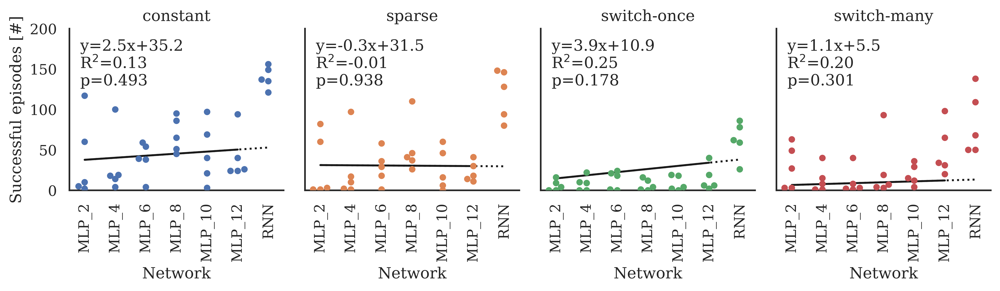

In [16]:
### Plots for manuscript
# %config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 300

datasets = [
        'constantx5b5', 
        'constantx5b5_0.4', 
        'switch45x5b5', 
        'noisy3x5b5',
]

# alt_labels = ['(a) constant', '(b) sparse', '(c) switch-once', '(d) switch-many']
alt_labels = ['constant', 'sparse', 'switch-once', 'switch-many']


# Seaborn -- adding reg. line is easier
# plt.figure(figsize=(7,3))
# fig, axs = plt.subplots(1,1, figsize=(7,3))
success_counts_df = counts_df.query("done == 'HOME' and dataset == @datasets and model_code != 'MLPs999'")
# success_counts_df['label'] = success_counts_df['dataset'].map({})
g = sns.FacetGrid(success_counts_df, col='dataset', size=2.75, aspect=1.0, hue='dataset')
# g.map( sns.stripplot, 'model_code', 'n_success_episodes', dodge=True)
g.map( sns.swarmplot, 'model_code', 'n_success_episodes', dodge=True)
g.fig.subplots_adjust(wspace=0.1)
# g.set(ylim=(0,240))
g.set(ylim=(0,200))
# g.tight_layout() # incompatible with subplots_adjust
g.axes.flat[0].set_ylabel("Successful episodes [#]")

for ax, title in zip(g.axes.flat, alt_labels):
    ax.set_title(title)
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    ax.set_xticklabels([f'MLP_{x}' for x in [2,4,6,8,10,12]]+['RNN'])
    ax.set_xlabel('Network')
    

# Add regression line
# from numpy.polynomial.polynomial import polyfit
from scipy import stats # https://stackoverflow.com/questions/48370562/how-to-add-regression-line-and-regression-line-equation-on-graph
success_counts_df['memory'] = success_counts_df['model_code'].apply(lambda x: int(x.replace('MLPs','')))
for idx, ax in enumerate(g.axes.flat):
    ax_dataset = datasets[idx]
    ax_df = success_counts_df.query("dataset == @ax_dataset and memory <= 12")
    x = ax_df['memory']
    y = ax_df['n_success_episodes']
#     b, m = polyfit(x, y, 1)
    m, b, r_value, p_value, std_err = stats.linregress(x,y)
    x_plot = x/2 - 1 # starts at 0, ... 5 
    ax.plot(x_plot, b + m * x, '-', c='k', 
#            label='y={:.1f}x+{:.1f}'.format(m*2,b),
           ) 
    
    x_extended = np.array(x.to_list() + [14.0])
    x_plot_extended = np.array(x_plot.to_list() + [6.0])
    ax.plot(x_plot_extended, b + m * x_extended, ':', c='k', label='_nolabel')
    # https://stackoverflow.com/questions/36267705/avoiding-repeated-legend-in-seaborn-boxplot-overlaid-by-swarmplot
#     handles, labels = ax.get_legend_handles_labels()
#     ax.legend(handles[:1], labels[:1], loc='upper left')
    text = r'y={:.1f}x+{:.1f} \nR$^2$=1.0'.format(m*2,b)
    ax.annotate('y={:.1f}x+{:.1f}\n'.format(m*2,b) + 
                    r'R$^2$'+'={:.2f}\n'.format(r_value) +
                    r'p={:0.3f}'.format(p_value), 
                xy=(0.05, 0.65), 
                xycoords='axes fraction',
                fontsize=12,
#                 fontsize='large',
               )


# plt.legend()
plt.savefig(f"{outdir}/home_by_arch_facet.png", dpi=dpi_save, bbox_inches='tight')
# plt.show()


In [17]:
# ### Plots for manuscript
# %config InlineBackend.figure_format = 'retina'
# mpl.rcParams['figure.dpi'] = 300

# # Seaborn -- adding reg. line is easier
# success_counts_df = counts_df.query("done == 'HOME' and dataset == @datasets and model_code != 'MLPs999' and model_code != 'MLPs888' ")
# success_counts_df['memory'] = success_counts_df['model_code'].apply(lambda x: int(x.replace('MLPs','')))
# # g = sns.FacetGrid(success_counts_df, col='dataset', size=2.75, aspect=1.0, hue='dataset')
# # g.map( sns.stripplot, 'model_code', 'n_success_episodes', dodge=True)

# g = sns.lmplot(data=success_counts_df, 
#            x='memory',
#            y='n_success_episodes',
#            hue='dataset',
#            col='dataset',               
#            size=2.75, 
#            aspect=1.0, 
#            dodge=True,
#           )

# g.fig.subplots_adjust(wspace=0.1)
# g.set(ylim=(0,200))
# g.axes.flat[0].set_ylabel("Successful episodes [#]")

# # for ax, title in zip(g.axes.flat, alt_labels):
# #     ax.set_title(title)
# #     ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
# #     ax.set_xticklabels([f'MLP_{x}' for x in [2,4,6,8,10,12]])
# #     ax.set_xlabel('Network')
    

# plt.savefig(f"{outdir}/home_by_arch_facet.png", dpi=dpi_save, bbox_inches='tight')
# # plt.show()



In [18]:
# Stop

In [19]:
# Same as above but matplotlib only
# plt.figure(figsize=(4,3.5))
# fig, axs = plt.subplots(nrows=1, ncols=4, sharey=True, sharex=True, figsize=(7,2.5))
# for idx, dataset in enumerate(datasets): 
#     success_counts_df = counts_df.query("done == 'HOME' and dataset == @dataset and model_code != 'MLPs999'")
#     sns.swarmplot(x="model_code", y="n_success_episodes", 
#                        hue='dataset', 
# #                        hue_order=datasets,
#                        data=success_counts_df, dodge=True, ax=axs[idx]) # color=".25",

# #     handles, labels = ax.get_legend_handles_labels()
# #     ax.legend(handles=handles[1:], labels=labels[1:])
# #     ax.legend(handles=handles, labels=labels, loc='upper left')
    
#     ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
#     ax.set_ylim(0, 240)
    
# plt.tight_layout()
# plt.savefig(f"{outdir}/diffs_{suffix}.png", dpi=dpi_save, bbox_inches='tight')
# plt.show()



# success_counts_df = counts_df.query("done == 'HOME' and dataset in @datasets and model_code != 'MLPs999'")
# # plt.figure(figsize=(4,3.5))
# plt.figure(figsize=(6,3))
# ax = sns.swarmplot(x="model_code", y="n_success_episodes",
#                    hue='dataset', hue_order=datasets,
#                    data=success_counts_df, dodge=True) # color=".25",

# handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles=handles, labels=labels, loc='upper left')

# ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
# ax.set_xticklabels([f'MLP_{x}' for x in [2,4,6,8,10,12]]+['VRNN'])
# ax.set_ylim(0, 240)
# plt.tight_layout()
# plt.ylabel("Successful episodes [#]")
# plt.xlabel('')

# alt_labels = ['constant', 'sparse', 'switch-once', 'switch-many']
# labels=plt.legend(labelspacing=0.07, ncol=2, loc='upper left').get_texts()
# for i, l in enumerate(alt_labels):
#     labels[i].set_text(l)

# plt.savefig(f"{outdir}/home_by_arch_ALL.png", dpi=dpi_save, bbox_inches='tight')
# plt.show()

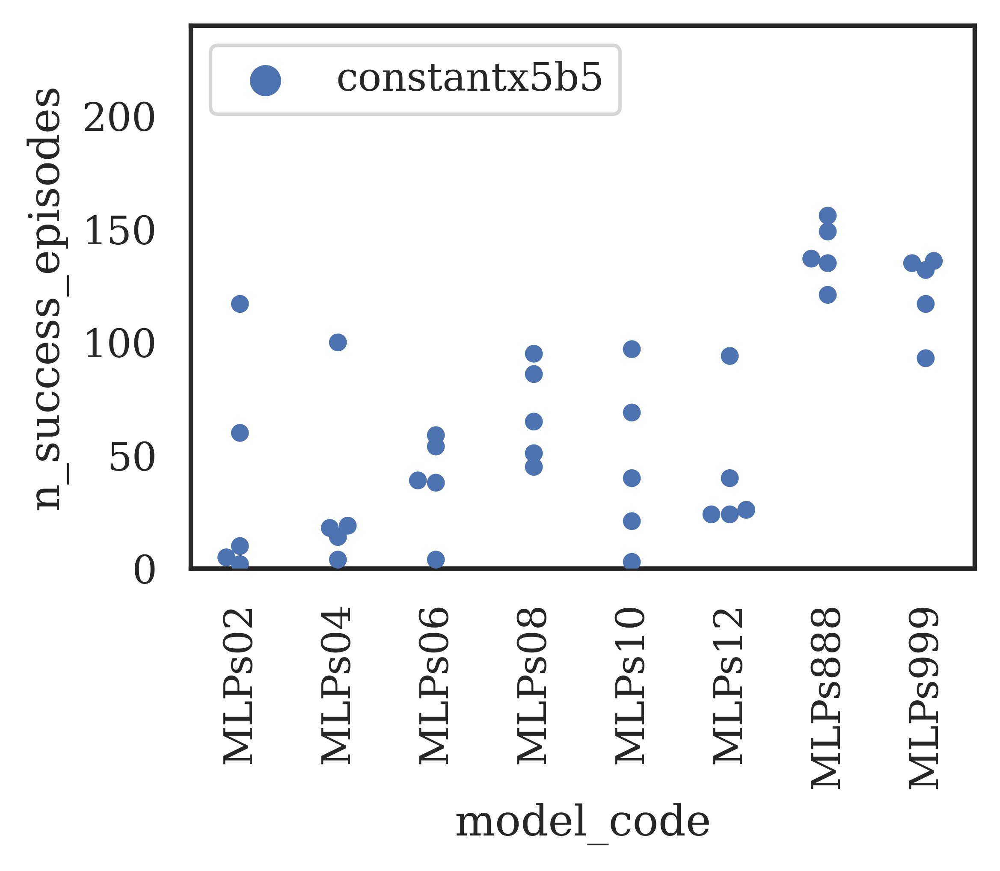

In [20]:
### Combined plots for manuscript
datasets = [
        'constantx5b5', 
#         'constantx5b5_0.8',
#         'constantx5b5_0.6',
#         'constantx5b5_0.4', 
#         'constantx5b5_0.2',
]

success_counts_df = counts_df.query("done == 'HOME' and dataset == @datasets")
plt.figure(figsize=(4,3.5))
# ax = sns.boxplot(x="model_code", y="n_success_episodes", data=success_counts_df)
ax = sns.swarmplot(x="model_code", y="n_success_episodes", 
                   hue='dataset', hue_order=datasets,
                   data=success_counts_df, dodge=True) # color=".25",

handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles=handles[1:], labels=labels[1:])
ax.legend(handles=handles, labels=labels, loc='upper left')


ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_ylim(0, 240)
plt.tight_layout()
plt.savefig(f"{outdir}/home_by_arch_constant.png", dpi=dpi_save, bbox_inches='tight')
plt.show()

constantx5b5_0.2


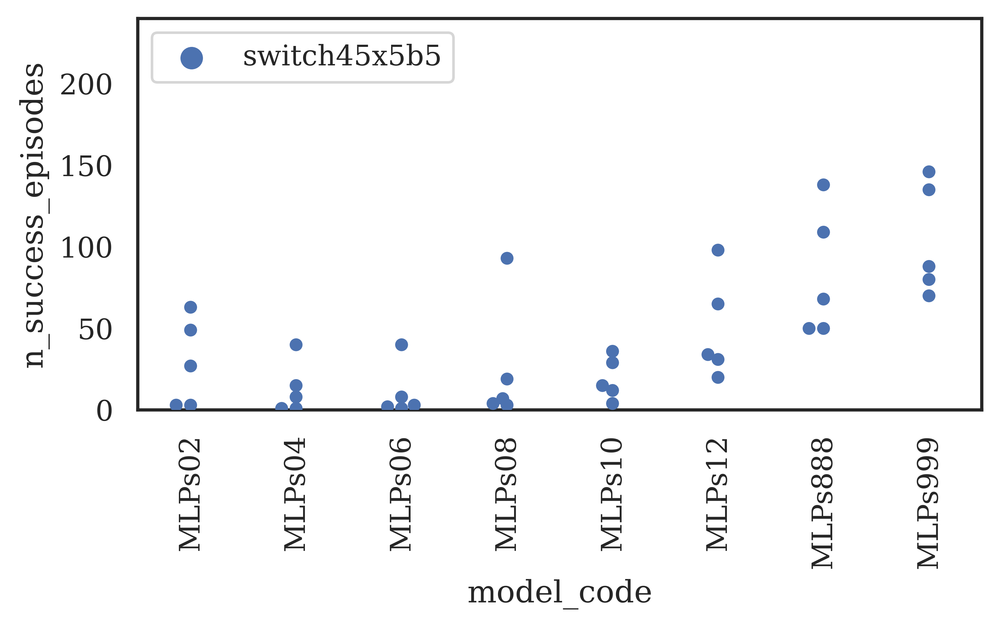

In [21]:
### Combined plots for manuscript


datasets = [
#         'constantx5b5', 
        'switch15x5b5', 
        'switch30x5b5', 
        'switch45x5b5', 
#         'noisy3x5b5', 
#         'noisy6x5b5',
#         'constantx5b5_0.8',
#         'constantx5b5_0.6',
#         'constantx5b5_0.4', 
#         'constantx5b5_0.2',
]

success_counts_df = counts_df.query("done == 'HOME' and dataset == @datasets")
success_counts_df
print(dataset)
plt.figure(figsize=(5.5,3.5))
# ax = sns.boxplot(x="model_code", y="n_success_episodes", data=success_counts_df)
ax = sns.swarmplot(x="model_code", y="n_success_episodes", hue='dataset', 
                   data=success_counts_df, dodge=True) # color=".25",

handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles=handles[1:], labels=labels[1:])
ax.legend(handles=handles, labels=labels, loc='upper left')


ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_ylim(0, 240)
plt.tight_layout()
plt.savefig(f"{outdir}/home_by_arch_switches.png", dpi=dpi_save, bbox_inches='tight')
plt.show()




constantx5b5_0.2


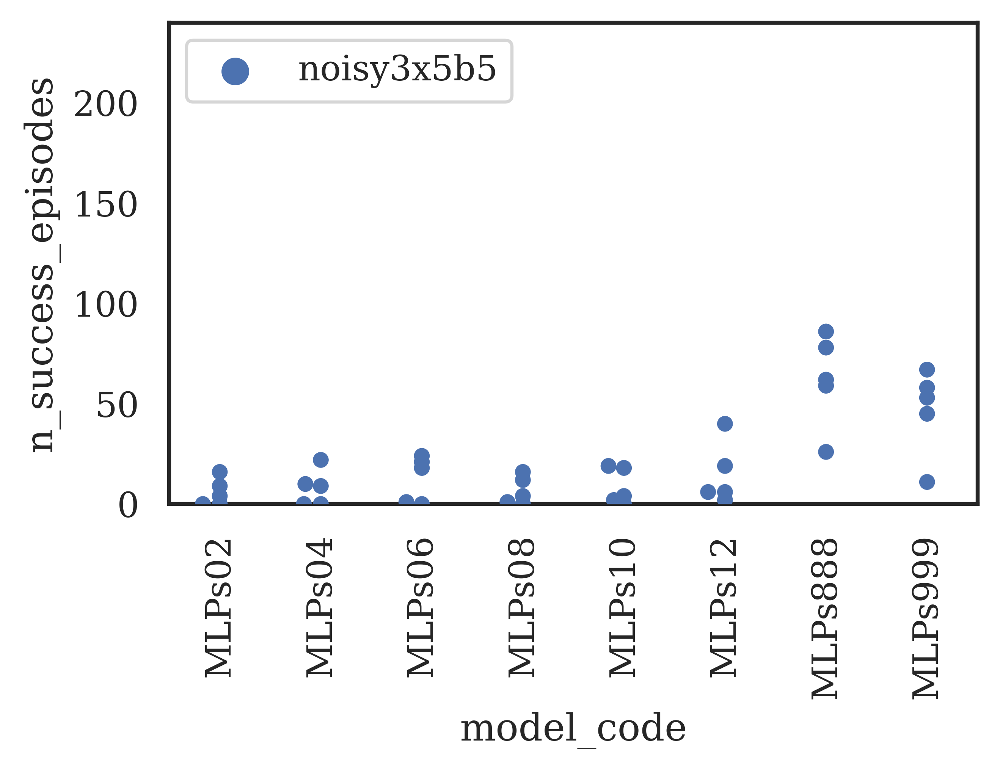

In [22]:
### Combined plots for manuscript


datasets = [
#         'constantx5b5', 
        'noisy3x5b5', 
        'noisy6x5b5',
]

success_counts_df = counts_df.query("done == 'HOME' and dataset == @datasets")
success_counts_df
print(dataset)
plt.figure(figsize=(4.5,3.5))
# ax = sns.boxplot(x="model_code", y="n_success_episodes", data=success_counts_df)
ax = sns.swarmplot(x="model_code", y="n_success_episodes", hue='dataset', 
                   data=success_counts_df, dodge=True) # color=".25",

handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles=handles[1:], labels=labels[1:])
ax.legend(handles=handles, labels=labels, loc='upper left')


ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_ylim(0, 240)
plt.tight_layout()
plt.savefig(f"{outdir}/home_by_arch_noisy.png", dpi=dpi_save, bbox_inches='tight')
plt.show()





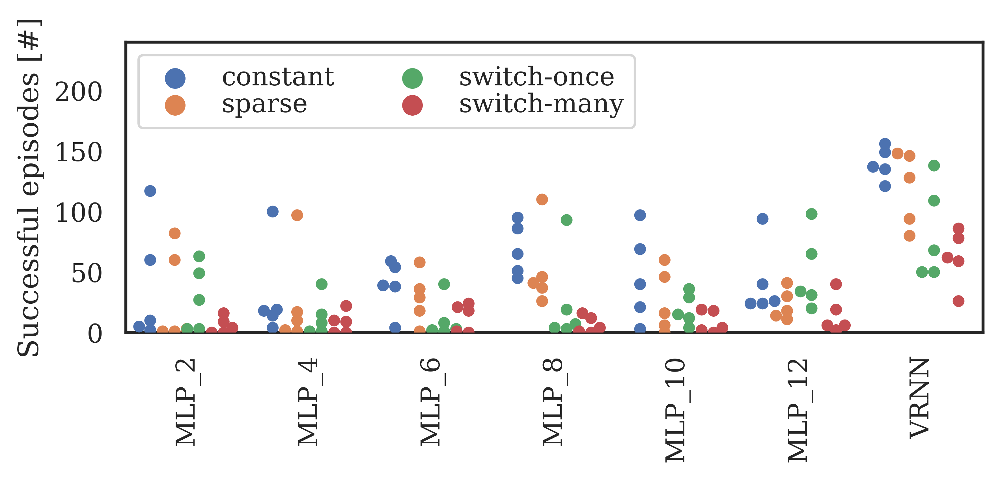

In [23]:
### Combined plots for manuscript
%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 300

datasets = [
        'constantx5b5', 
        'constantx5b5_0.4', 
        'switch45x5b5', 
        'noisy3x5b5',
]

success_counts_df = counts_df.query("done == 'HOME' and dataset in @datasets and model_code != 'MLPs999'")
# plt.figure(figsize=(4,3.5))
plt.figure(figsize=(6,3))
ax = sns.swarmplot(x="model_code", y="n_success_episodes",
                   hue='dataset', hue_order=datasets,
                   data=success_counts_df, dodge=True) # color=".25",

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=labels, loc='upper left')

ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xticklabels([f'MLP_{x}' for x in [2,4,6,8,10,12]]+['VRNN'])
ax.set_ylim(0, 240)
plt.tight_layout()
plt.ylabel("Successful episodes [#]")
plt.xlabel('')

alt_labels = ['constant', 'sparse', 'switch-once', 'switch-many']
labels=plt.legend(labelspacing=0.07, ncol=2, loc='upper left').get_texts()
for i, l in enumerate(alt_labels):
    labels[i].set_text(l)

plt.savefig(f"{outdir}/home_by_arch_ALL.png", dpi=dpi_save, bbox_inches='tight')
plt.show()

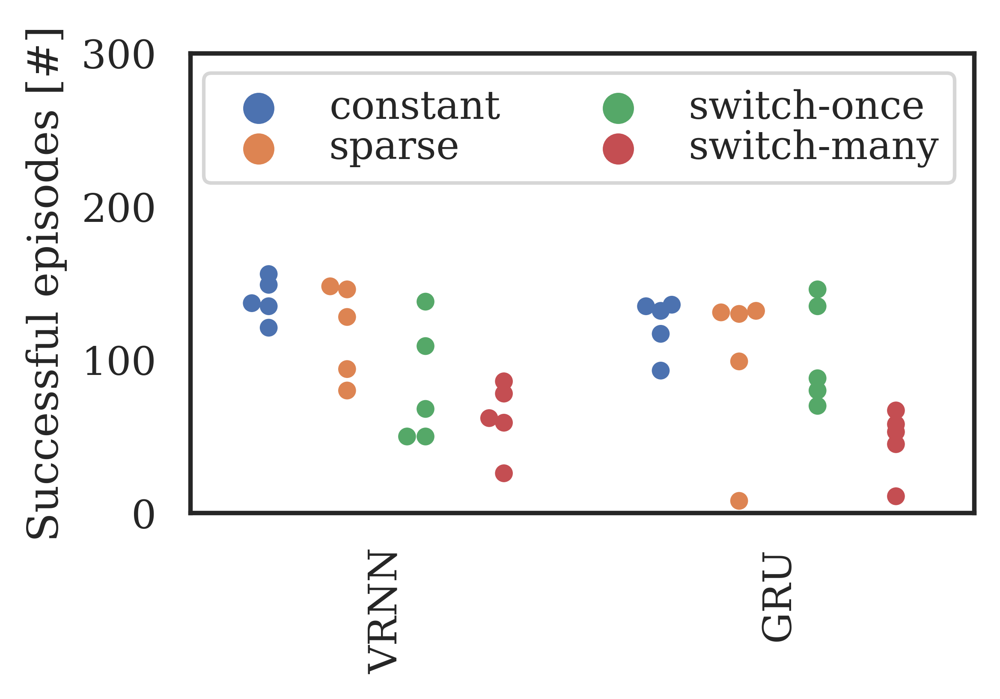

In [24]:
### Combined plots for manuscript
%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 300

datasets = [
        'constantx5b5', 
        'constantx5b5_0.4', 
        'switch45x5b5', 
        'noisy3x5b5',
]

model_codes = ['MLPs999', 'MLPs888']
success_counts_df = counts_df.query("done == 'HOME' and dataset in @datasets and model_code in @model_codes")
# plt.figure(figsize=(4,3.5))
plt.figure(figsize=(4,3))
ax = sns.swarmplot(x="model_code", y="n_success_episodes",
                   hue='dataset', hue_order=datasets,
                   data=success_counts_df, dodge=True) # color=".25",

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=labels, loc='upper left')

ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xticklabels(['VRNN', 'GRU'])
ax.set_ylim(0, 300)
plt.tight_layout()
plt.ylabel("Successful episodes [#]")
plt.xlabel('')

alt_labels = ['constant', 'sparse', 'switch-once', 'switch-many']
labels=plt.legend(labelspacing=0.07, ncol=2).get_texts()
for i, l in enumerate(alt_labels):
    labels[i].set_text(l)

plt.savefig(f"{outdir}/home_by_arch_VRNN_GRU.png", dpi=dpi_save, bbox_inches='tight')
plt.show()

## Differences within one architecture

In [25]:
# https://stackoverflow.com/questions/22787209/how-to-have-clusters-of-stacked-bars-with-python-pandas
# https://stackoverflow.com/questions/47494557/pandas-side-by-side-stacked-bar-plot
import pandas as pd
import matplotlib.cm as cm
import numpy as np
import matplotlib.pyplot as plt

def plot_clustered_stacked(dfall, labels=None, title="multiple stacked bar plot",  H="/", **kwargs):
    """Given a list of dataframes, with identical columns and index, create a clustered stacked bar plot. 
labels is a list of the names of the dataframe, used for the legend
title is a string for the title of the plot
H is the hatch used for identification of the different dataframe"""

    n_df = len(dfall)
    n_col = len(dfall[0].columns) 
    n_ind = len(dfall[0].index)
    axe = plt.subplot(111)

    for df in dfall : # for each data frame
        axe = df.plot(kind="bar",
                      figsize=(5.5,3),
                      linewidth=0,
                      stacked=True,
                      ax=axe,
                      legend=False,
                      grid=False,
                      color=['g', 'r', 'b', 'g', 'k'],
                      **kwargs)  # make bar plots

    hatches = [' ', '/', '.', '\\', 'o']

    h,l = axe.get_legend_handles_labels() # get the handles we want to modify
    for i in range(0, n_df * n_col, n_col): # len(h) = n_col * n_df
        for j, pa in enumerate(h[i:i+n_col]):
            for rect in pa.patches: # for each index
                rect.set_x(rect.get_x() + 1 / float(n_df + 1) * i / float(n_col))
#                 rect.set_hatch(H * int(i / n_col)) #edited part     
                rect.set_hatch(hatches[int(i / n_col)]) #edited part     
                rect.set_width(1 / float(n_df + 1))

    axe.set_xticks((np.arange(0, 2 * n_ind, 2) + 1 / float(n_df + 1)) / 2.)
    axe.set_xticklabels(df.index, rotation = 0)
    axe.set_title(title)

    # Add invisible data to add another legend
#     n=[]        
#     for i in range(n_df):
# #         n.append(axe.bar(0, 0, color="gray", hatch=H * i))
#         n.append(axe.bar(0, 0, color="gray", hatch=hatches[i]))

#     l1 = axe.legend(h[:n_col], l[:n_col], loc=[1.01, 0.5])
#     if labels is not None:
#         l2 = plt.legend(n, labels, loc=[1.01, 0.1]) 
#     axe.add_artist(l1)
    return axe

(-0.5, 3.8)

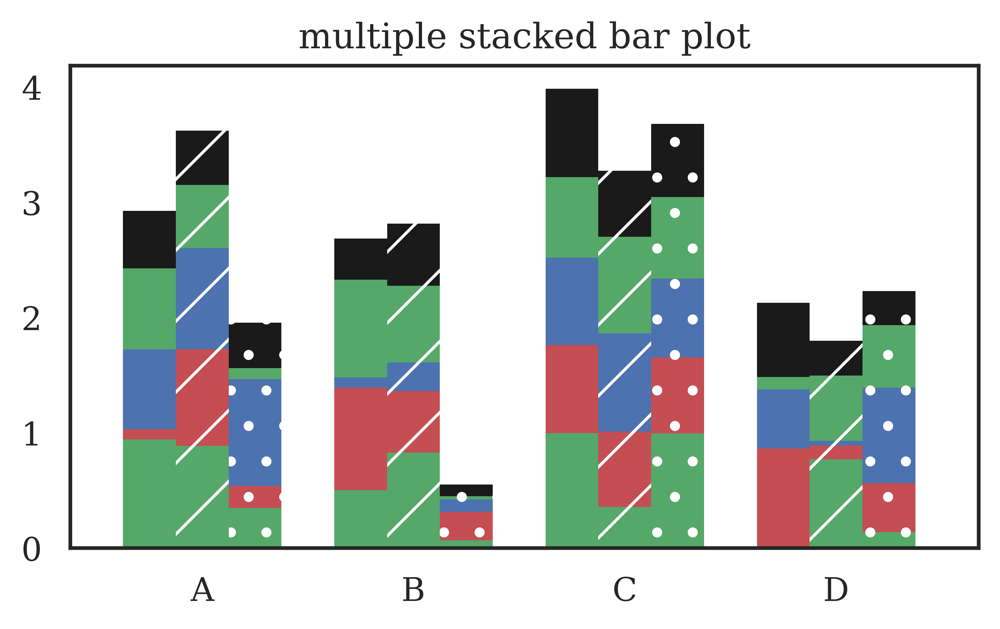

In [26]:
# create fake dataframes
df1 = pd.DataFrame(np.random.rand(4, 5),
                   index=["A", "B", "C", "D"],
                   columns=["I", "J", "K", "L", "M"])
df2 = pd.DataFrame(np.random.rand(4, 5),
                   index=["A", "B", "C", "D"],
                   columns=["I", "J", "K", "L", "M"])
df3 = pd.DataFrame(np.random.rand(4, 5),
                   index=["A", "B", "C", "D"], 
                   columns=["I", "J", "K", "L", "M"])

# Then, just call :
plot_clustered_stacked([df1, df2, df3],["df1", "df2", "df3"])
plt.xlim(-0.5, 3.8)

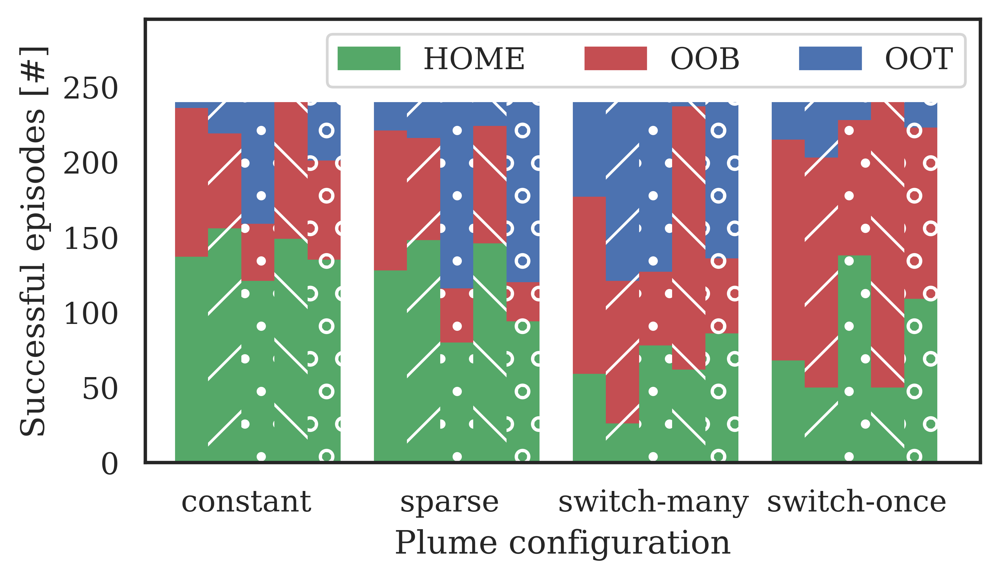

In [27]:
import matplotlib.patches as mpatches
datasets_vrnns = [
        'constantx5b5', 
#         'switch15x5b5', 
#         'switch30x5b5', 
        'switch45x5b5', 
        'noisy3x5b5', 
#         'noisy6x5b5',
#         'constantx5b5_0.8',
#         'constantx5b5_0.6',
        'constantx5b5_0.4', 
#         'constantx5b5_0.2',
]

    

vrnns = counts_df.query("model_code == 'MLPs888' and dataset in @datasets_vrnns")
dfs = [ vrnns.query('seed == @seed').pivot(index='dataset', columns='done', values='n_success_episodes')
       for seed in vrnns['seed'].unique() ]
# df1.head()
# dfs[0].head()
plot_clustered_stacked(dfs, np.arange(5)+1)
plt.xlim(-0.4, 3.8)
ax = plt.gca()
ax.set_xticklabels([' constant', 
                    '  sparse', 
                    '   switch-many', 
                    '    switch-once'])
plt.ylim(0, 295)

plt.ylabel("Successful episodes [#]")
plt.xlabel('Plume configuration')
plt.title('')
handles, labels = plt.gca().get_legend_handles_labels()
patch1 = mpatches.Patch(color='g', label='HOME')   
patch2 = mpatches.Patch(color='r', label='OOB')   
patch3 = mpatches.Patch(color='b', label='OOT')   
# handles.extend([patch1, patch2])
handles = [patch1, patch2, patch3]
# handles.extend([patch,line])
plt.legend(handles=handles, loc='upper right', ncol=3)
# plt.tight_layout()
plt.show()

In [28]:
# Among successful episodes, how do regime distributions differ?
all_episodes_df['p_track'] = all_episodes_df['n_track']/all_episodes_df['ep_length']
all_episodes_df['p_recover'] = all_episodes_df['n_recover']/all_episodes_df['ep_length']
all_episodes_df['p_search'] = all_episodes_df['n_search']/all_episodes_df['ep_length']

regime_dists_df = all_episodes_df[['model_code', 
                                   'seed', 
                                   'dataset', 
                                   'done',
                                   'n_track', 'n_recover', 'n_search', 
                                   'p_track', 'p_recover', 'p_search', 
                                   'avg_stray_distance', 
                                   'avg_odor_lastenc', 
                                   'median_stray_distance', 
                                   'median_odor_lastenc', 
                                  ]].groupby(['model_code', 'dataset', 'seed', 'done']).mean().unstack(fill_value=0).stack() 
# regime_dists_df.columns = ['n_success_episodes']
regime_dists_df.reset_index(inplace=True)
regime_dists_df.head()
regime_dists_df

,model_code,dataset,seed,done,n_track,n_recover,n_search,p_track,p_recover,p_search,avg_stray_distance,avg_odor_lastenc,median_stray_distance,median_odor_lastenc
0,MLPs02,constantx5b5,15118e9,HOME,122.683333,28.716667,35.800000,0.689676,0.152149,0.158175,0.142413,12.383160,0.105194,4.125000
1,MLPs02,constantx5b5,15118e9,OOB,10.531250,25.062500,199.322917,0.038029,0.111282,0.850689,1.058709,107.246207,1.048284,106.364583
2,MLPs02,constantx5b5,15118e9,OOT,75.892857,31.547619,191.559524,0.253822,0.105510,0.640667,0.601546,75.255256,0.522536,63.869048
3,MLPs02,constantx5b5,2150879,HOME,144.600000,20.000000,29.000000,0.783090,0.108887,0.108023,0.129642,8.173653,0.098219,1.000000
4,MLPs02,constantx5b5,2150879,OOB,12.392857,25.214286,210.035714,0.051050,0.107166,0.841784,1.171905,112.467476,1.155773,110.714286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
835,MLPs999,switch45x5b5,2924121,OOB,7.666667,26.083333,188.500000,0.033639,0.121725,0.844636,1.020805,102.736596,1.009389,101.375000
836,MLPs999,switch45x5b5,2924121,OOT,54.292683,40.195122,204.512195,0.181581,0.134432,0.683987,0.561917,84.818501,0.525852,74.182927
837,MLPs999,switch45x5b5,876de,HOME,122.500000,26.685714,11.800000,0.780664,0.164221,0.055115,0.150767,6.387366,0.108955,2.457143
838,MLPs999,switch45x5b5,876de,OOB,44.894366,31.725352,156.753521,0.190372,0.137486,0.672143,0.823122,71.931459,0.811991,62.542254


In [29]:
datasets_vrnns = [
        'constantx5b5', 
#         'switch15x5b5', 
#         'switch30x5b5', 
        'switch45x5b5', 
        'noisy3x5b5', 
#         'noisy6x5b5',
#         'constantx5b5_0.8',
#         'constantx5b5_0.6',
        'constantx5b5_0.4', 
#         'constantx5b5_0.2',
]

colrs = ['g', 'b', 'r', 'k']
cdict = {}
for i,k in enumerate(datasets_vrnns):
    cdict[k] = colrs[i] 



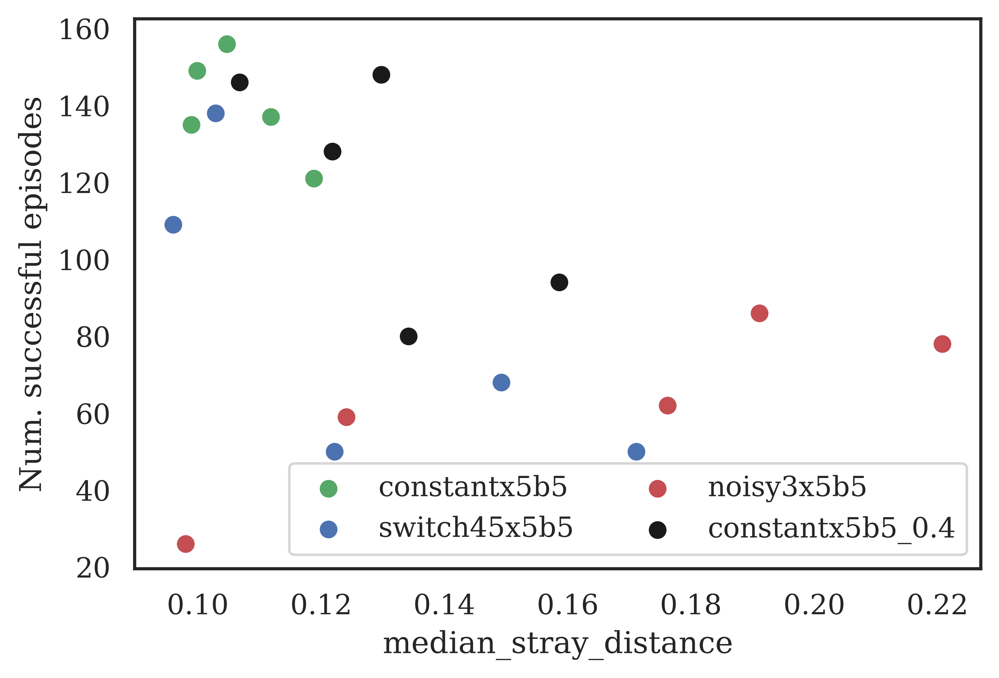

In [30]:
# plt.figure(figsize=(4,3))
for dataset in datasets_vrnns:
    dfc = counts_df.query("model_code == 'MLPs888' and dataset in @dataset and done == 'HOME'")
#     dfc = counts_df.query("model_code == 'MLPs888' and dataset in @dataset")
    dfc
    dfp = regime_dists_df.query("model_code == 'MLPs888' and dataset in @dataset and done == 'HOME'")
#     dfp = regime_dists_df.query("model_code == 'MLPs888' and dataset in @dataset")
    dfp

    plt.scatter(dfp['median_stray_distance'], dfc['n_success_episodes'], c=cdict[dataset], label=dataset)
    plt.xlabel("median_stray_distance")
#     plt.scatter(dfp['avg_odor_lastenc'], dfc['n_success_episodes'], c=cdict[dataset], label=dataset)
#     plt.xlabel("avg_odor_lastenc")
#     plt.scatter(dfp['median_odor_lastenc'], dfc['n_success_episodes'], c=cdict[dataset], label=dataset)
#     plt.xlabel("median_odor_lastenc")

    plt.ylabel("Num. successful episodes")
plt.legend(ncol=2)

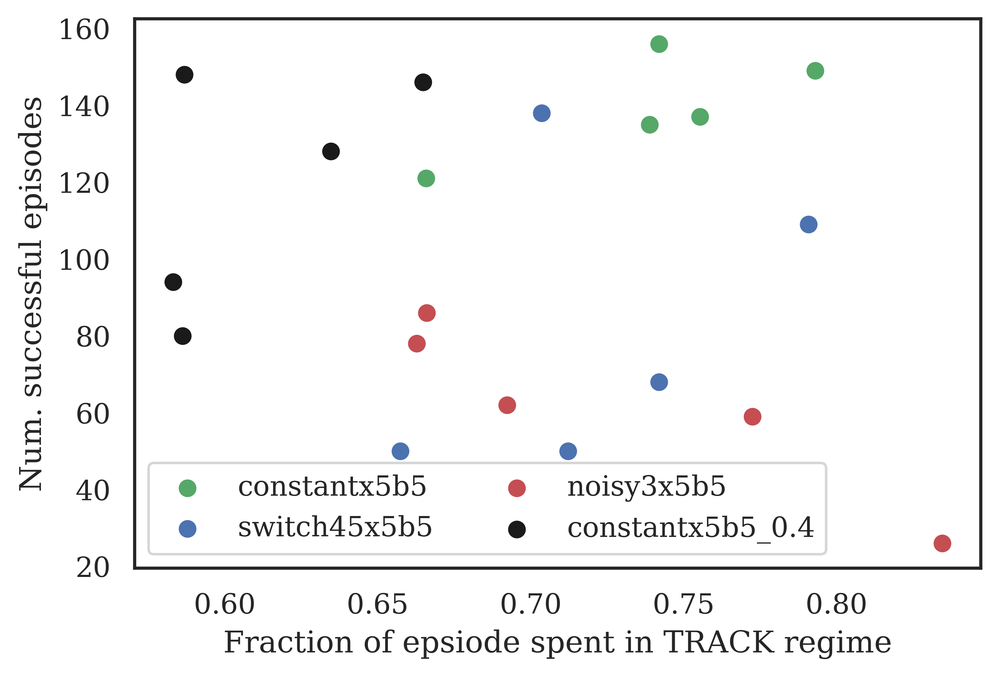

In [31]:

# plt.figure(figsize=(4,3))
for dataset in datasets_vrnns:
    # dfc = counts_df.query("model_code == 'MLPs888' and dataset in 'constantx5b5' and done == 'HOME'")
    dfc = counts_df.query("model_code == 'MLPs888' and dataset in @dataset and done == 'HOME'")
    dfc
    # dfp = regime_dists_df.query("model_code == 'MLPs888' and dataset in 'constantx5b5' and done == 'HOME'")
    dfp = regime_dists_df.query("model_code == 'MLPs888' and dataset in @dataset and done == 'HOME'")
    dfp

    plt.scatter(dfp['p_track'], dfc['n_success_episodes'], c=cdict[dataset], label=dataset)
    plt.ylabel("Num. successful episodes")
    plt.xlabel("Fraction of epsiode spent in TRACK regime")
plt.legend(ncol=2)

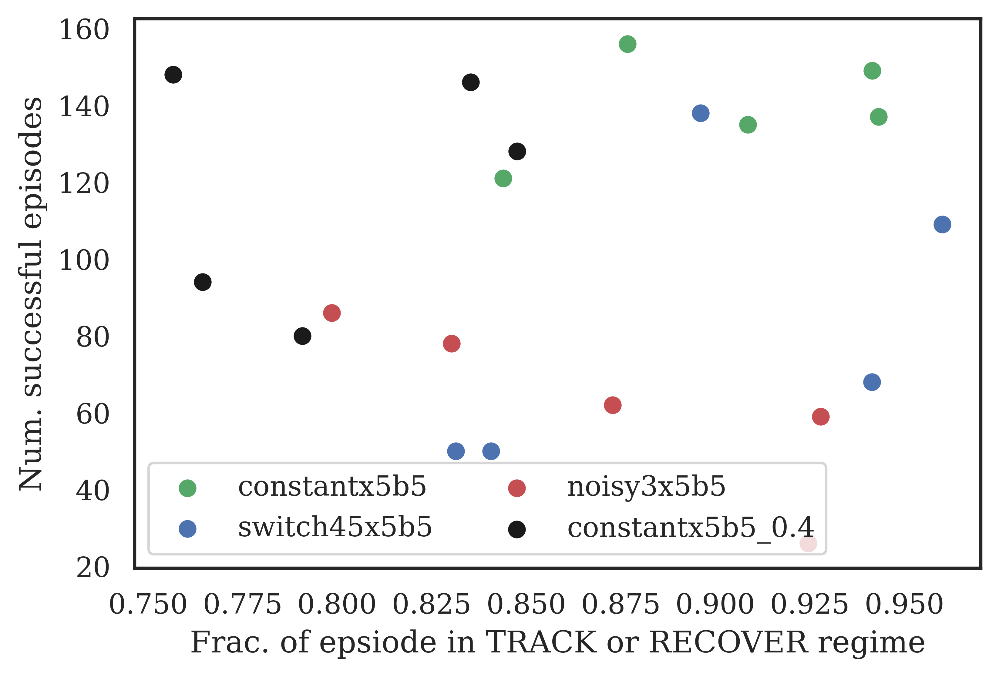

In [32]:
for dataset in datasets_vrnns:
    # dfc = counts_df.query("model_code == 'MLPs888' and dataset in 'constantx5b5' and done == 'HOME'")
    dfc = counts_df.query("model_code == 'MLPs888' and dataset in @dataset and done == 'HOME'")
    dfc
    # dfp = regime_dists_df.query("model_code == 'MLPs888' and dataset in 'constantx5b5' and done == 'HOME'")
    dfp = regime_dists_df.query("model_code == 'MLPs888' and dataset in @dataset and done == 'HOME'")
    dfp

    plt.scatter(dfp['p_track']+dfp['p_recover'], dfc['n_success_episodes'], c=cdict[dataset], label=dataset)
    plt.ylabel("Num. successful episodes")
    plt.xlabel("Frac. of epsiode in TRACK or RECOVER regime")
plt.legend(ncol=2)

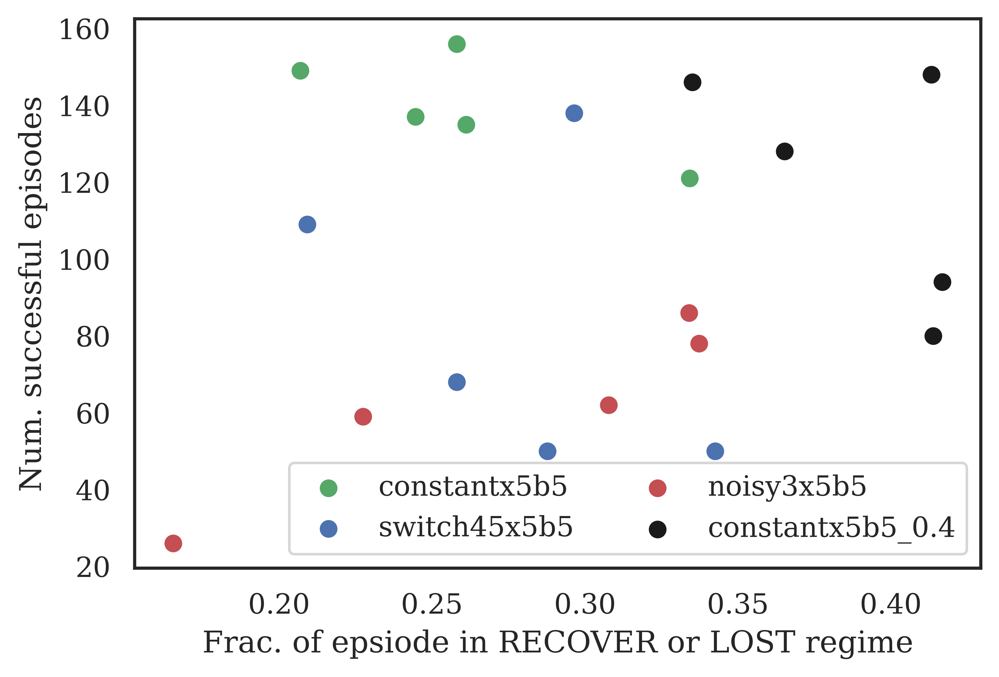

In [33]:
for dataset in datasets_vrnns:
    # dfc = counts_df.query("model_code == 'MLPs888' and dataset in 'constantx5b5' and done == 'HOME'")
    dfc = counts_df.query("model_code == 'MLPs888' and dataset in @dataset and done == 'HOME'")
    dfc
    # dfp = regime_dists_df.query("model_code == 'MLPs888' and dataset in 'constantx5b5' and done == 'HOME'")
    dfp = regime_dists_df.query("model_code == 'MLPs888' and dataset in @dataset and done == 'HOME'")
    dfp

    plt.scatter(dfp['p_recover']+dfp['p_search'], dfc['n_success_episodes'], c=cdict[dataset], label=dataset)
    plt.ylabel("Num. successful episodes")
    plt.xlabel("Frac. of epsiode in RECOVER or LOST regime")
plt.legend(ncol=2)

In [34]:
import matplotlib.patches as mpatches
datasets_vrnns = [
        'constantx5b5', 
#         'switch15x5b5', 
#         'switch30x5b5', 
        'switch45x5b5', 
        'noisy3x5b5', 
#         'noisy6x5b5',
#         'constantx5b5_0.8',
#         'constantx5b5_0.6',
        'constantx5b5_0.4', 
#         'constantx5b5_0.2',
]

vrnns = regime_dists_df.query("model_code == 'MLPs888' and dataset in @datasets_vrnns")
vrnns.query("done == 'HOME' and dataset in 'constantx5b5'")

# dfs = [ vrnns.query('seed == @seed').pivot(index='dataset', columns='done', values='n_success_episodes')
#        for seed in vrnns['seed'].unique() ]
# # df1.head()
# # dfs[0].head()
# plot_clustered_stacked(dfs, np.arange(5)+1)
# plt.xlim(-0.4, 3.8)
# ax = plt.gca()
# ax.set_xticklabels([' constant', 
#                     '  sparse', 
#                     '   switch-many', 
#                     '    switch-once'])
# plt.ylim(0, 295)

# plt.ylabel("Successful episodes [#]")
# plt.xlabel('Plume configuration')
# plt.title('')
# handles, labels = plt.gca().get_legend_handles_labels()
# patch1 = mpatches.Patch(color='g', label='HOME')   
# patch2 = mpatches.Patch(color='r', label='OOB')   
# patch3 = mpatches.Patch(color='b', label='OOT')   
# # handles.extend([patch1, patch2])
# handles = [patch1, patch2, patch3]
# # handles.extend([patch,line])
# plt.legend(handles=handles, loc='upper right', ncol=3)
# # plt.tight_layout()
# plt.show()

,model_code,dataset,seed,done,n_track,n_recover,n_search,p_track,p_recover,p_search,avg_stray_distance,avg_odor_lastenc,median_stray_distance,median_odor_lastenc
630,MLPs888,constantx5b5,2760377,HOME,98.781022,24.080292,9.000000,0.755392,0.187825,0.056783,0.147061,5.608981,0.111848,2.277372
633,MLPs888,constantx5b5,3199993,HOME,110.923077,20.846154,25.538462,0.741970,0.134778,0.123252,0.145965,8.947484,0.104719,2.717949
636,MLPs888,constantx5b5,3307e9,HOME,105.826446,29.859504,34.421488,0.665778,0.178100,0.156122,0.179562,13.935244,0.118842,7.227273
639,MLPs888,constantx5b5,776762,HOME,100.295302,18.516779,9.543624,0.793035,0.148514,0.058451,0.131626,5.382738,0.099876,2.463087
642,MLPs888,constantx5b5,9781ba,HOME,109.807407,26.733333,20.229630,0.738859,0.169799,0.091343,0.133360,7.452570,0.098938,3.259259


In [35]:
# sns.pairplot(vrnns)

In [36]:
# archs = ['MLPs02',
#         'MLPs04',
#         'MLPs06',
#         'MLPs08',
#         'MLPs10',
#         'MLPs12',
#         'MLPs888', 
#         'MLPs999']

In [37]:
# for arch in archs:
#     arch_home_counts = counts_df.query("done == 'HOME' and model_code == @arch")
#     arch_home_counts.head()

#     plt.figure(figsize=(5,4))
#     ax = sns.swarmplot(x="dataset", y="n_success_episodes", 
#                        data=arch_home_counts, color=".25")
#     ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
#     plt.title(arch)
#     plt.tight_layout()
#     plt.savefig(f"{outdir}/home_by_dataset_{arch}.png", dpi=dpi_save, bbox_inches='tight')
#     plt.ylim(0, 240)
#     plt.show()

## Analyse episode metadata

In [38]:
fail_episodes_df = all_episodes_df.query('done != "HOME"') 
pass_episodes_df = all_episodes_df.query('done == "HOME"') 
all_episodes_df.head()

,index,idx,done,ep_length,n_track,n_recover,n_search,off_plume_fraction,turn_score,speed_score,...,end_y,start_x,start_y,reward,dataset,model_code,seed,p_track,p_recover,p_search
0,0,0,OOB,27,0,25,2,1.000000,0.128604,0.998720,...,-2.386676,4.0,-0.702148,-0.200000,constantx5b5,MLPs888,3307e9,0.000000,0.925926,0.074074
1,1,1,OOB,138,14,25,99,0.891304,0.400271,0.458752,...,-2.294095,4.0,-0.202148,-0.546363,constantx5b5,MLPs888,3307e9,0.101449,0.181159,0.717391
2,2,2,HOME,225,211,14,0,0.462222,0.419192,0.998658,...,-0.176505,4.0,0.081909,100.833333,constantx5b5,MLPs888,3307e9,0.937778,0.062222,0.000000
3,3,3,HOME,83,71,12,0,0.506024,0.376409,0.983057,...,0.021487,4.0,0.365967,101.300351,constantx5b5,MLPs888,3307e9,0.855422,0.144578,0.000000
4,4,4,OOT,299,0,25,274,1.000000,0.448517,0.427188,...,2.211499,4.0,0.865967,-0.359830,constantx5b5,MLPs888,3307e9,0.000000,0.083612,0.916388


In [39]:
# all_episodes_df[['model_code', 'seed', 'done']].groupby(['model_code', 'seed']).count()
all_episodes_df.columns

Index(['index', 'idx', 'done', 'ep_length', 'n_track', 'n_recover', 'n_search',
       'off_plume_fraction', 'turn_score', 'speed_score', 'num_exits',
       'max_exit_duration', 'max_stray_distance', 'max_odor_lastenc',
       'avg_stray_distance', 'avg_odor_lastenc', 'median_stray_distance',
       'median_odor_lastenc', 'agent_angle_ground_median', 'radius_final',
       'radius_covered', 'end_x', 'end_y', 'start_x', 'start_y', 'reward',
       'dataset', 'model_code', 'seed', 'p_track', 'p_recover', 'p_search'],
      dtype='object')

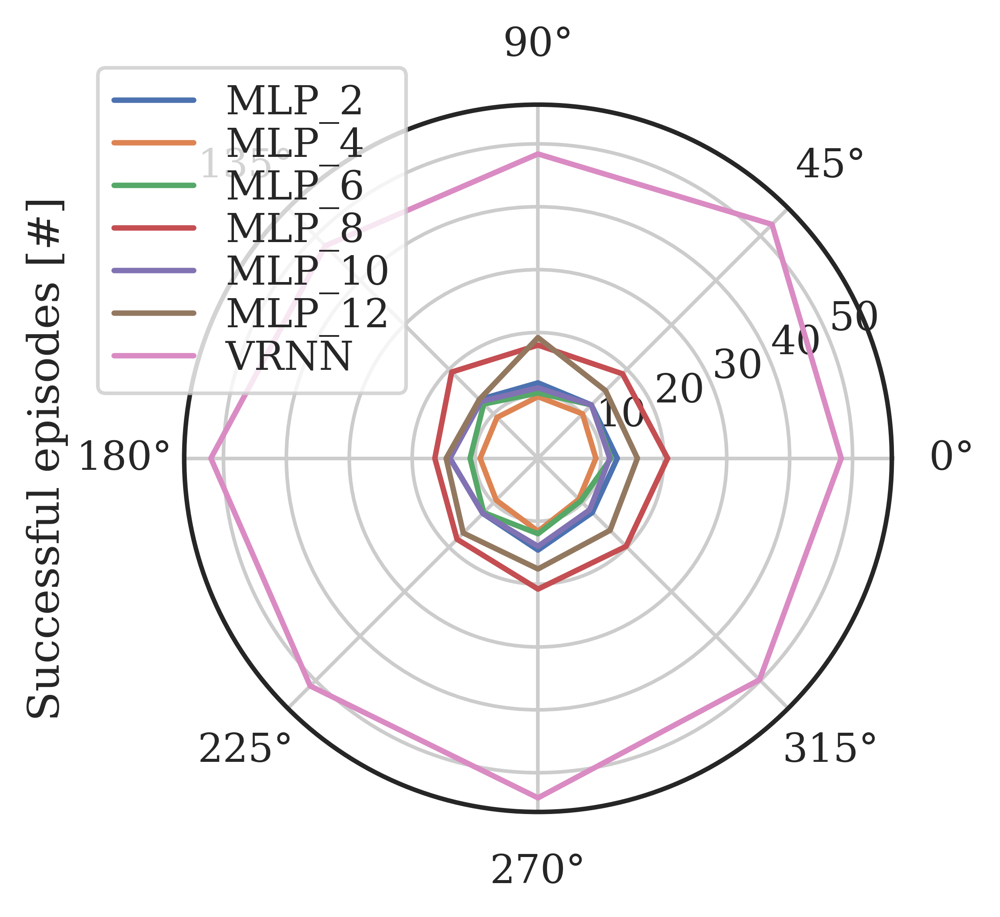

In [40]:
%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 300


pass_episodes_df['start_orient'] = pass_episodes_df['idx'] % 8
pass_episodes_df['start_orient']
# dataset = 'constantx5b5'
# # dataset = 'switch45x5b5'
# # dataset = 'noisy3x5b5'
datasets = [
        'constantx5b5', 
        'constantx5b5_0.4', 
        'switch45x5b5', 
        'noisy3x5b5',
]

home_by_angle = pass_episodes_df.query("dataset in @datasets and model_code != 'MLPs999'")\
                             .pivot_table(index='model_code', 
                             columns='start_orient', 
                             values='done', 
                             fill_value=0, 
                             aggfunc='count')\
                                     .unstack().to_frame()\
                                     .rename(columns={0:'count'}).reset_index()
home_by_angle['count'] /= 5 # number of seeds per model_type
home_by_angle.sample(5)

# https://towardsdatascience.com/how-to-make-stunning-radar-charts-with-python-implemented-in-matplotlib-and-plotly-91e21801d8ca
# https://www.pythoncharts.com/matplotlib/radar-charts/
# https://www.kaggle.com/typewind/draw-a-radar-chart-with-python-in-a-simple-way
categories = [
    r'$0$', 
    r'$\frac{1}{4}\pi$', 
    r'$\frac{1}{2}\pi$', 
    r'$\frac{3}{4}\pi$', 
    r'$\pi$', 
    r'$\frac{5}{4}\pi$', 
    r'$\frac{3}{2}\pi$', 
    r'$\frac{7}{4}\pi$'
]
categories = [*categories, categories[0]]

label_loc = np.linspace(start=0, stop=2 * np.pi, num=9)
plt.figure(figsize=(3.5, 4.25))
plt.subplot(polar=True)


for modelc in home_by_angle['model_code'].unique():
    subset_df = home_by_angle.query("model_code == @modelc")
    stats = subset_df['count'].to_list()
    stats=np.concatenate((stats,[stats[0]]))
    plt.plot(label_loc, stats, label=modelc)


# lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories) # don't care
# plt.ylim(0, 25)
# plt.ylim(0, 23)
plt.legend(loc='upper left', bbox_to_anchor=(-0.15, 1.08))
alt_labels = [f'MLP_{x}' for x in [2,4,6,8,10,12]]+['VRNN']
labels=plt.legend(loc='upper left', bbox_to_anchor=(-0.15, 1.08), labelspacing=0.07).get_texts()
for i, l in enumerate(alt_labels):
    labels[i].set_text(l)
# plt.gca().legend(loc='upper left', bbox_to_anchor=(-0.15, 1.08))
ylab = plt.ylabel("Successful episodes [#]")
ylab.set_position((0, 0.5))
# ylab.set_rotation(0)
ax = plt.gca()
# plt.text(1, .8, "test", transform=ax.transAxes)
ax.yaxis.labelpad = 32
plt.show()

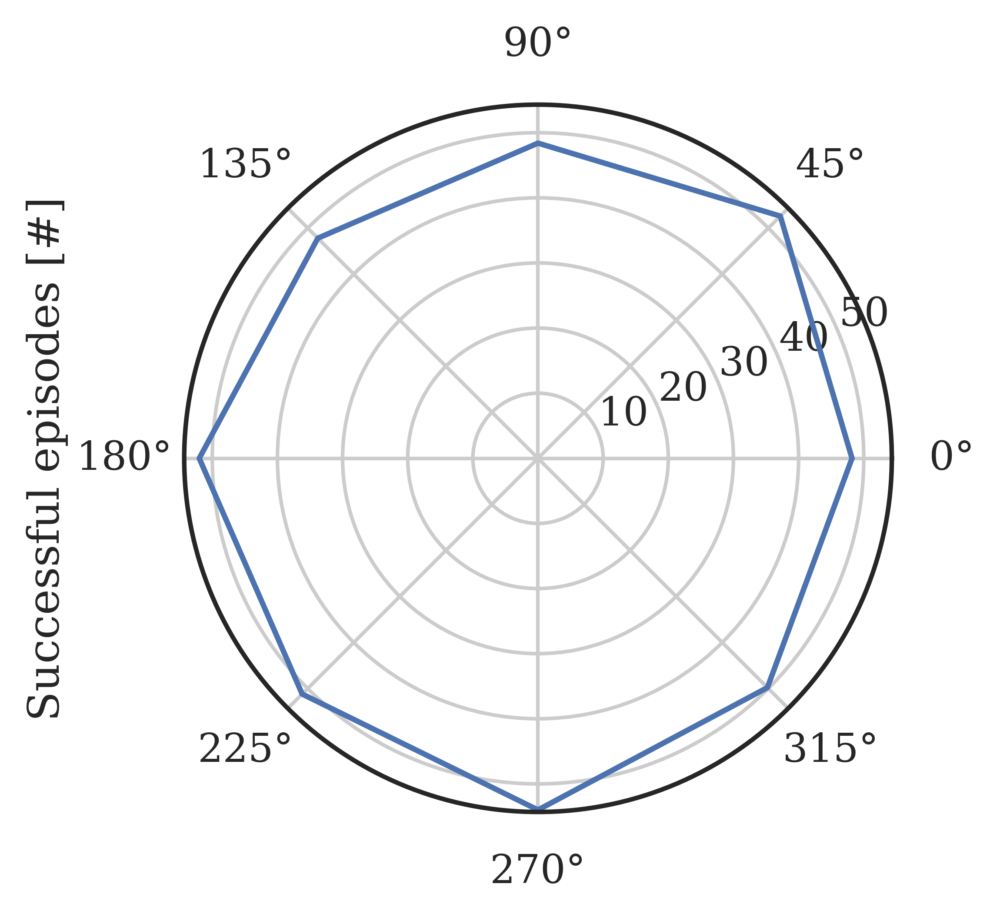

In [41]:
%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 300


pass_episodes_df['start_orient'] = pass_episodes_df['idx'] % 8
pass_episodes_df['start_orient']
# dataset = 'constantx5b5'
# # dataset = 'switch45x5b5'
# # dataset = 'noisy3x5b5'
datasets = [
        'constantx5b5', 
        'constantx5b5_0.4', 
        'switch45x5b5', 
        'noisy3x5b5',
]

home_by_angle = pass_episodes_df.query("dataset in @datasets and model_code == 'MLPs888'")\
                             .pivot_table(index='model_code', 
                             columns='start_orient', 
                             values='done', 
                             fill_value=0, 
                             aggfunc='count')\
                                     .unstack().to_frame()\
                                     .rename(columns={0:'count'}).reset_index()
home_by_angle['count'] /= 5 # number of seeds per model_type
home_by_angle.sample(5)

# https://towardsdatascience.com/how-to-make-stunning-radar-charts-with-python-implemented-in-matplotlib-and-plotly-91e21801d8ca
# https://www.pythoncharts.com/matplotlib/radar-charts/
# https://www.kaggle.com/typewind/draw-a-radar-chart-with-python-in-a-simple-way
categories = [
    r'$0$', 
    r'$\frac{1}{4}\pi$', 
    r'$\frac{1}{2}\pi$', 
    r'$\frac{3}{4}\pi$', 
    r'$\pi$', 
    r'$\frac{5}{4}\pi$', 
    r'$\frac{3}{2}\pi$', 
    r'$\frac{7}{4}\pi$'
]
categories = [*categories, categories[0]]

label_loc = np.linspace(start=0, stop=2 * np.pi, num=9)
plt.figure(figsize=(3.5, 4.25))
plt.subplot(polar=True)


for key in home_by_angle['model_code'].unique():
    subset_df = home_by_angle.query("model_code == @key")
    stats = subset_df['count'].to_list()
    stats=np.concatenate((stats,[stats[0]]))
    plt.plot(label_loc, stats, label=key)


# lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories) # don't care
# plt.ylim(0, 25)
# plt.ylim(0, 23)
# plt.legend(loc='upper left', bbox_to_anchor=(-0.15, 1.08))
# alt_labels = ['RNN']
# labels=plt.legend(loc='upper left', bbox_to_anchor=(-0.15, 1.08), labelspacing=0.07).get_texts()
# for i, l in enumerate(alt_labels):
#     labels[i].set_text(l)
# plt.gca().legend(loc='upper left', bbox_to_anchor=(-0.15, 1.08))
ylab = plt.ylabel("Successful episodes [#]")
ylab.set_position((0, 0.5))
# ylab.set_rotation(0)
ax = plt.gca()
# plt.text(1, .8, "test", transform=ax.transAxes)
ax.yaxis.labelpad = 32
plt.show()

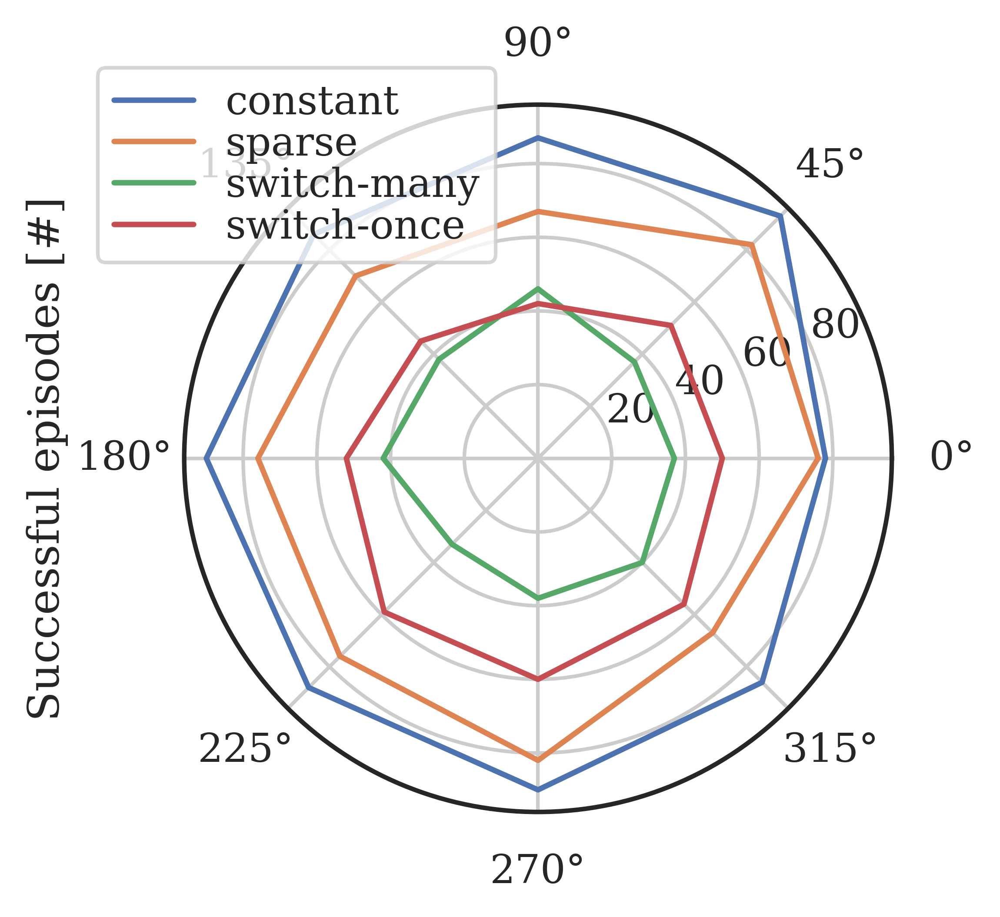

In [42]:
%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 300


pass_episodes_df['start_orient'] = pass_episodes_df['idx'] % 8
pass_episodes_df['start_orient']
# dataset = 'constantx5b5'
# # dataset = 'switch45x5b5'
# # dataset = 'noisy3x5b5'
datasets = [
        'constantx5b5', 
        'constantx5b5_0.4', 
        'switch45x5b5', 
        'noisy3x5b5',
]

home_by_angle = pass_episodes_df.query("dataset in @datasets and model_code == 'MLPs888'")\
                             .pivot_table(index='dataset', 
                             columns='start_orient', 
                             values='done', 
                             fill_value=0, 
                             aggfunc='count')\
                                     .unstack().to_frame()\
                                     .rename(columns={0:'count'}).reset_index()

# https://towardsdatascience.com/how-to-make-stunning-radar-charts-with-python-implemented-in-matplotlib-and-plotly-91e21801d8ca
# https://www.pythoncharts.com/matplotlib/radar-charts/
# https://www.kaggle.com/typewind/draw-a-radar-chart-with-python-in-a-simple-way
categories = [
    r'$0$', 
    r'$\frac{1}{4}\pi$', 
    r'$\frac{1}{2}\pi$', 
    r'$\frac{3}{4}\pi$', 
    r'$\pi$', 
    r'$\frac{5}{4}\pi$', 
    r'$\frac{3}{2}\pi$', 
    r'$\frac{7}{4}\pi$'
]
categories = [*categories, categories[0]]

label_loc = np.linspace(start=0, stop=2 * np.pi, num=9)
plt.figure(figsize=(3.5, 4.25))
plt.subplot(polar=True)


for key in home_by_angle['dataset'].unique():
    subset_df = home_by_angle.query("dataset == @key")
    stats = subset_df['count'].to_list()
    stats=np.concatenate((stats,[stats[0]]))
    plt.plot(label_loc, stats, label=key)

# lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories) # don't care
# plt.ylim(0, 25)
# plt.ylim(0, 23)
plt.legend(loc='upper left', bbox_to_anchor=(-0.15, 1.08), labelspacing=0.07)
alt_labels = ['constant', 'sparse', 'switch-many', 'switch-once']
labels=plt.legend(loc='upper left', bbox_to_anchor=(-0.15, 1.08), labelspacing=0.07).get_texts()
for i, l in enumerate(alt_labels):
    labels[i].set_text(l)
# plt.gca().legend(loc='upper left', bbox_to_anchor=(-0.15, 1.08), labelspacing=0.07)
ylab = plt.ylabel("Successful episodes [#]")
ylab.set_position((0, 0.5))
# ylab.set_rotation(0)
ax = plt.gca()
# plt.text(1, .8, "test", transform=ax.transAxes)
ax.yaxis.labelpad = 32
plt.show()

In [43]:
# # https://towardsdatascience.com/how-to-make-stunning-radar-charts-with-python-implemented-in-matplotlib-and-plotly-91e21801d8ca
# # https://www.pythoncharts.com/matplotlib/radar-charts/
# # https://www.kaggle.com/typewind/draw-a-radar-chart-with-python-in-a-simple-way
# categories = [
#     r'$0$', 
#     r'$\frac{1}{4}\pi$', 
#     r'$\frac{1}{2}\pi$', 
#     r'$\frac{3}{4}\pi$', 
#     r'$\pi$', 
#     r'$\frac{5}{4}\pi$', 
#     r'$\frac{3}{2}\pi$', 
#     r'$\frac{7}{4}\pi$'
# ]
# categories = [*categories, categories[0]]

# restaurant_1 = [4, 4, 5, 4, 3, 5, 4, 3]
# restaurant_2 = [5, 5, 4, 5, 2, 5, 4, 3]
# restaurant_3 = [3, 4, 5, 3, 5, 5, 4, 3]
# restaurant_1 = [*restaurant_1, restaurant_1[0]]
# restaurant_2 = [*restaurant_2, restaurant_2[0]]
# restaurant_3 = [*restaurant_3, restaurant_3[0]]

# label_loc = np.linspace(start=0, stop=2 * np.pi, num=len(restaurant_1))

# plt.figure(figsize=(3, 3))
# plt.subplot(polar=True)
# plt.plot(label_loc, restaurant_1, label='Restaurant 1')
# plt.plot(label_loc, restaurant_2, label='Restaurant 2')
# plt.plot(label_loc, restaurant_3, label='Restaurant 3')
# # plt.title('Restaurant comparison', size=20, y=1.05)
# lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories)
# plt.legend()
# plt.show()

### Analyse only HOME episodes

In [44]:
col_subset = [
            'model_code',
            'seed',
            'dataset',
#             'ep_length', # uninteresting (biased)
            'radius_final', # not useful when HOME
            'radius_covered',
#             'turn_score',  # uninteresting
#             'speed_score',  # uninteresting
            'off_plume_fraction', 
            'num_exits', 
            'max_odor_lastenc',
            'max_stray_distance',
            'sparsity'
           ]
col_subset = [c for c in col_subset if c in all_episodes_df.columns]
col_plot = [ c for c in col_subset if c not in ['seed', 'model_code', 'dataset'] ]

datasets = [
        'constantx5b5', 
#         'switch15x5b5', 
#         'switch30x5b5', 
        'switch45x5b5', 
        'noisy3x5b5', 
#         'noisy6x5b5',
#         'constantx5b5_0.8',
#         'constantx5b5_0.6',
#         'constantx5b5_0.4', 
#         'constantx5b5_0.2',
]

print(pass_episodes_df.columns)

Index(['index', 'idx', 'done', 'ep_length', 'n_track', 'n_recover', 'n_search',
       'off_plume_fraction', 'turn_score', 'speed_score', 'num_exits',
       'max_exit_duration', 'max_stray_distance', 'max_odor_lastenc',
       'avg_stray_distance', 'avg_odor_lastenc', 'median_stray_distance',
       'median_odor_lastenc', 'agent_angle_ground_median', 'radius_final',
       'radius_covered', 'end_x', 'end_y', 'start_x', 'start_y', 'reward',
       'dataset', 'model_code', 'seed', 'p_track', 'p_recover', 'p_search',
       'start_orient'],
      dtype='object')


In [45]:
# By Arch
col_plot = [
#             'radius_final', # not useful when HOME
#             'radius_covered',
#             'turn_score',  # uninteresting
#             'speed_score',  # uninteresting
#             'off_plume_fraction', 
#             'num_exits', 
#             'max_odor_lastenc',
#             'max_stray_distance',
           ]

dataset_plot = [
        'constantx5b5', 
#         'switch15x5b5', 
#         'switch30x5b5', 
        'switch45x5b5', 
        'noisy3x5b5', 
#         'noisy6x5b5',
#         'constantx5b5_0.8',
#         'constantx5b5_0.6',
#         'constantx5b5_0.4', 
#         'constantx5b5_0.2',
]


# for dataset in dataset_plot:
#     aggregated = pass_episodes_df.query("dataset == @dataset").groupby(by=['seed','model_code']).mean().reset_index()
# #     xorder = [ 'MLPs' + x for x in ['02', '04', '06', '08', '10', '12', '888', '999'] ]
#     xorder = archs
#     print(xorder)
# #     aggregated
#     for col in col_plot:
#         print(col)
#         plt.figure(figsize=(4,3))
#         ax = sns.swarmplot(x="model_code", y=col, data=aggregated, color=".25",
#                           order=xorder)
#         ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
#         plt.title("HOME: " + dataset)
#         plt.tight_layout()
#         plt.savefig(f"{outdir}/ep_by_arch_HOME_{dataset}_{col}.png", dpi=dpi_save, bbox_inches='tight')
#         plt.show()

In [46]:
# By dataset
datasets = [
        'constantx5b5', 
        'constantx5b5_0.8',
        'constantx5b5_0.6',
        'constantx5b5_0.4', 
        'constantx5b5_0.2',
        'switch15x5b5', 
        'switch30x5b5', 
        'switch45x5b5', 
        'noisy6x5b5',
        'noisy3x5b5', 
]

# archs_subset = ['MLPs888']
# for arch in archs_subset:    
#     aggregated = pass_episodes_df.query("model_code == @arch").groupby(by=['seed','dataset']).mean().reset_index()
#     for col in col_plot:
#         print(col)
#         plt.figure(figsize=(4,4))
#         ax = sns.swarmplot(x="dataset", y=col, data=aggregated, color=".25", order=datasets)
#         ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
#         plt.title(f"HOME:{arch}")
#         plt.tight_layout()
#         plt.savefig(f"{outdir}/ep_by_dataset_{arch}_{col}.png", dpi=dpi_save, bbox_inches='tight')
#         plt.show()

### Analyse FAIL episodes

In [47]:
# By Arch

archs = [
#     'MLPs02',
#     'MLPs04',
#     'MLPs06',
#     'MLPs08',
#     'MLPs10',
    'MLPs12',
    'MLPs888', 
    'MLPs999'
]

col_plot = [
#             'radius_final', # not useful when HOME
#             'radius_covered',
#             'turn_score',  # uninteresting
#             'speed_score',  # uninteresting
#             'off_plume_fraction', 
#             'num_exits', 
#             'max_odor_lastenc',
#             'max_stray_distance',
           ]

dataset_plot = [
        'constantx5b5', 
#         'switch15x5b5', 
#         'switch30x5b5', 
        'switch45x5b5', 
        'noisy3x5b5', 
#         'noisy6x5b5',
#         'constantx5b5_0.8',
#         'constantx5b5_0.6',
#         'constantx5b5_0.4', 
#         'constantx5b5_0.2',
]


for dataset in dataset_plot:
    aggregated = fail_episodes_df.query("dataset == @dataset").groupby(by=['seed','model_code']).mean().reset_index()
#     xorder = [ 'MLPs' + x for x in ['02', '04', '06', '08', '10', '12', '888', '999'] ]
    xorder = archs
    print(xorder)
#     aggregated
    for col in col_plot:
        print(col)
        plt.figure(figsize=(4,3))
        ax = sns.swarmplot(x="model_code", y=col, data=aggregated, color=".25",
                          order=xorder)
        ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
        plt.title("HOME: " + dataset)
        plt.tight_layout()
        plt.savefig(f"{outdir}/ep_by_arch_HOME_{dataset}_{col}.png", dpi=dpi_save, bbox_inches='tight')
        plt.show()

['MLPs12', 'MLPs888', 'MLPs999']
['MLPs12', 'MLPs888', 'MLPs999']
['MLPs12', 'MLPs888', 'MLPs999']


### Analyse ALL episodes

In [48]:
# # By Arch
# print(archs)
# for col in col_plot:
#   for dataset in datasets:
#     aggregated = all_episodes_df.query("dataset == @dataset").groupby(by=['seed','model_code']).mean().reset_index()
#     plt.figure(figsize=(4,3))
#     ax = sns.swarmplot(x="model_code", y=col, data=aggregated, color=".25",
#                       order=archs)
#     ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
#     plt.title("ALL: " + dataset)
#     plt.tight_layout()
#     plt.savefig(f"{outdir}/ep_by_arch_{dataset}_{col}.png", dpi=dpi_save, bbox_inches='tight')
#     plt.show()

In [49]:
# By dataset
# datasets = [
#         'constantx5b5', 
#         'switch15x5b5', 
#         'switch30x5b5', 
#         'switch45x5b5', 
#         'noisy3x5b5', 
#         'noisy6x5b5',
#         'constantx5b5_0.8',
#         'constantx5b5_0.6',
#         'constantx5b5_0.4', 
#         'constantx5b5_0.2',
# ]

# archs_subset = ['MLPs888']
# for arch in archs_subset:    
#     aggregated = all_episodes_df.query("model_code == @arch").groupby(by=['seed','dataset']).mean().reset_index()
#     for col in col_plot:
#         print(col)
#         plt.figure(figsize=(4,4))
#         ax = sns.swarmplot(x="dataset", y=col, data=aggregated, color=".25")
#         ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
#         plt.title(f"ALL:{arch}")
#         plt.tight_layout()
#         plt.savefig(f"{outdir}/ep_by_dataset_{arch}_{col}.png", dpi=dpi_save, bbox_inches='tight')
#         plt.show()

## TODO: Visualize trajectories from multiple seeds [N seeds, 1arch, 1dataset]

In [50]:
# model_code = 'MLPs888'
# all_episodes_df.head()

In [51]:
# idx = 0
# print(datasets)
# dataset = datasets[0]

# arch_summaries = all_episodes_df.query("model_code == @model_code")
# arch_summaries.head()
# # arch_summaries.query("dataset == @dataset and idx == @idx")
# arch_summaries.query("dataset == @dataset and idx == @idx")

In [52]:
# model_dirs = natsorted(glob.glob(f'{expt_dir}/plume_*VRNN*/'))
# model_dir = model_dirs[0]
# model_dirs

In [53]:
# def get_log_df(model_dir, dataset):
#     log_df = []
#     log_fname = f'{model_dir}/{dataset}.pkl'
#     with open(log_fname, 'rb') as f_handle:
#         episode_logs = pickle.load(f_handle)

#     seed = model_dir.split('seed')[-1].split('/')[0]
#     for idx in range(len(episode_logs)):
#         log = episode_logs[idx]
#         log_df.append({'dataset': dataset, 
#                            'seed': seed,
#                             'idx': idx,
#                             'log': log,
#                             'done': log['infos'][-1][0]['done'],
#                            })

#     log_df = pd.DataFrame(log_df)
#     return(log_df)

# log_df_list = []
# for model_dir in tqdm.tqdm(model_dirs):
#     log_df = get_log_df(model_dir, dataset)
#     log_df_list.append( log_df )
# # log_df_list = [ get_log_df(model_dir, dataset) for model_dir in model_dirs ]
# print(log_df.shape)

In [54]:
# log_df.head()
# logs_for_idx = [ log_df['log'][idx] for log_df in log_df_list ]


In [55]:
# def visualize_episodes(episode_logs, 
#                        zoom=1, 
#                        outprefix=None, 
#                        title_text=True, 
#                        animate=False,
#                        fprefix='trajectory',
#                        dataset='constantx5b5',
#                        birthx=1.0,
#                        episode_idxs=None,
#                        colorby=None,
#                        vmin=0, vmax=1):

#     # Trim/preprocess loaded dataset!
#     t_starts = []
#     t_ends = []
#     for log in episode_logs: 
#         t_starts.append( log['infos'][0][0]['t_val'] )
#         t_ends.append( log['infos'][-1][0]['t_val'] )
#     # try:
#     #     radiusx = episode_logs[-1]['infos'][0][0]['radiusx']
#     # except Exception as e:
#     radiusx = 1.0    
#     data_puffs_all, data_wind_all = sim_analysis.load_plume(dataset, 
#         t_val_min=min(t_starts)-1.0, 
#         t_val_max=max(t_ends)+1.0,
#         radius_multiplier=radiusx,
#         puff_sparsity=np.clip(birthx, a_min=0.01, a_max=1.00),
#         )
#     t_vals_all = data_puffs_all['time'].unique()

#     # Plot and animate individual episodes
#     n_episodes = len(episode_logs)
#     if episode_idxs is None:
#         episode_idxs = [i for i in range(n_episodes)]

#     for episode_idx in range(n_episodes): 
#         episode_idx_title = episode_idxs[episode_idx] # Hack to take in custom idxs
#         trajectory = episode_logs[episode_idx]['trajectory']
#         traj_df = pd.DataFrame( trajectory )
#         t_val_end = t_ends[episode_idx]
#         traj_df['odor_obs'] = [o[0][-1] for o in episode_logs[episode_idx]['observations']] 
#         # print(traj_df.shape)

#         if title_text:
#             title_text = f"ep:{episode_idx} t:{t_val_end:0.2f} "
#             title_text += "step: {}".format(traj_df.shape[0])
#         else:
#             title_text = None

#         if outprefix is not None:
#             output_fname = f"{outprefix}/{fprefix}_{episode_idx_title:03}.png"
#             print(output_fname)
#         else:
#             output_fname = None

#         # Flip plume about x-axis (generalization)
#         flipx = episode_logs[episode_idx]['infos'][0][0]['flipx']
#         if flipx < 0:
#             data_wind = data_wind_all.copy() # flip this per episode
#             data_puffs = data_puffs_all.query("time <= @t_val_end + 1").copy()
#             data_wind.loc[:,'wind_y'] *= flipx   
#             data_puffs.loc[:,'y'] *= flipx 
#         else:
#             data_wind = data_wind_all.query("time <= @t_val_end + 1")
#             data_puffs = data_puffs_all.query("time <= @t_val_end + 1")

#         t_vals = [record[0]['t_val'] for record in episode_logs[episode_idx]['infos']]

#         if colorby == 'regime': # HACK!
#             # print("visualize_episodes", colorby)
#             traj_df2 = log_analysis.get_traj_df(episode_logs[episode_idx], 
#                             extended_metadata=False, squash_action=False)
#             traj_df['regime'] = traj_df2['regime']

#         fig, ax = visualize_single_episode(data_puffs, data_wind, 
#             traj_df, episode_idx_title, zoom, t_val_end, 
#             title_text, output_fname, colorby=colorby, vmin=vmin, vmax=vmax)

#         if animate:
#             animate_single_episode(data_puffs, data_wind, traj_df, 
#                 t_vals, t_vals_all, episode_idx_title, outprefix, 
#                 fprefix, zoom, colorby=colorby) 

            
# def visualize_single_episode(data_puffs, data_wind, traj_df, 
#     episode_idx, zoom=1, t_val=None, title_text=None, output_fname=None, 
#     show=True, colorby=None, vmin=0, vmax=1):

#     try:
#         plotsize=(8,8)      
#         fig, ax = sim_analysis.plot_puffs_and_wind_vectors(data_puffs, data_wind, t_val, 
#                                            fname='', plotsize=plotsize, show=show)
#     except Exception as e:
#         print(episode_idx, e)
#         return None, None

#     # Crosshair at source
#     plt.plot([0, 0],[-0.3,+0.3],'k-', linestyle = ":", lw=2)
#     plt.plot([-0.3,+0.3],[0, 0],'k-', linestyle = ":", lw=2)

#     # Handle custom colorby
#     if colorby is not None and type(colorby) is not str:
#         colors = colorby # assumes that colorby is a series
#         colorby = 'custom'

#     # Line for trajectory
#     linecolor = 'grey' if colorby is not None and colorby == 'regime' else 'red'
#     plt.plot(traj_df.iloc[:,0], traj_df.iloc[:,1], c=linecolor, lw=1) # Red line!
#     ax.scatter(traj_df.iloc[0,0], traj_df.iloc[0,1], c='black', marker='o', s=100) # Start
#     # ax.scatter(traj_df.iloc[-1,0], traj_df.iloc[-1,1], c='c', marker='x', s=70) # Start
#     # plt.colorbar(shrink=0.2) # Draw manually instead

#     # Scatter plot for odor/regime etc.
#     # if 'odor_obs' in traj_df.columns:
#     # Default: colors indicate odor present/absent
#     if colorby is None:
#         colors = [0. if x <= config.env['odor_threshold'] else 1. for x in traj_df['odor_obs']]
#         cm = plt.cm.get_cmap('winter')
#         plt.scatter(traj_df.loc[:,0], traj_df.loc[:,1], 
#             c=colors, s=20, cmap=cm, vmin=vmin, vmax=vmax, alpha=1.0)
#     if colorby is not None and colorby == 'complete': 
#         # Colors indicate % trajectory complete
#         colors = traj_df.index/len(traj_df)
#         cm = plt.cm.get_cmap('winter')
#         plt.scatter(traj_df.loc[:,0], traj_df.loc[:,1], 
#             c=colors, s=20, cmap=cm, vmin=vmin, vmax=vmax, alpha=1.0)
#     if colorby is not None and colorby == 'regime': 
#         # print("visualize_single_episode", colorby)
#         colors = [ config.regime_colormap[x] for x in traj_df['regime'].to_list() ]
#         cm = None
#         plt.scatter(traj_df.loc[:,0], traj_df.loc[:,1], 
#             c=colors, s=20, cmap=cm, vmin=vmin, vmax=vmax, alpha=1.0)
#     if colorby is not None and colorby == 'custom': 
#         cm = plt.cm.get_cmap('winter')
#         plt.scatter(traj_df.loc[:,0], traj_df.loc[:,1], 
#             c=colors, s=20, cmap=cm, vmin=vmin, vmax=vmax, alpha=1.0)



#     if zoom == 1: # Constant wind
#         plt.xlim(-0.5, 10.5)
#         plt.ylim(-2.5, +2.5)
#     if zoom == 2: # Switch or Noisy
#         plt.xlim(-1, 10.5)
#         plt.ylim(-5, 5)
#     if zoom == 3: # Walking
#         plt.xlim(-0.15, 0.5)
#         plt.ylim(-0.2, 0.2)

#     if title_text is not None:
#         plt.title(title_text)
#     # plt.xticks([])
#     # plt.yticks([])
#     plt.xlabel('Arena length [m]')
#     plt.ylabel('Arena width [m]')

#     if output_fname is not None:
#         plt.savefig(output_fname)
#     return fig, ax


In [56]:
# Start-end locations


constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_3307e9_constantx5b5.png


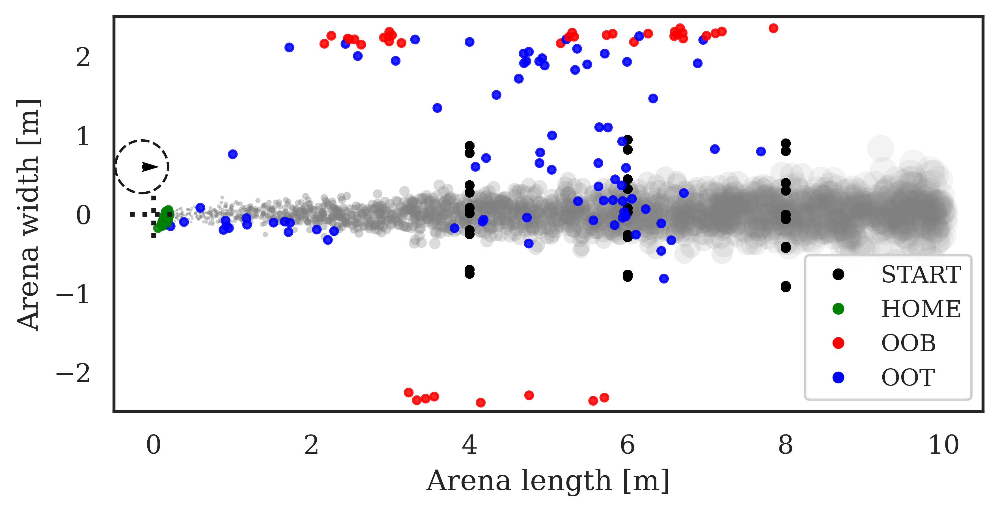

constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_9781ba_constantx5b5.png


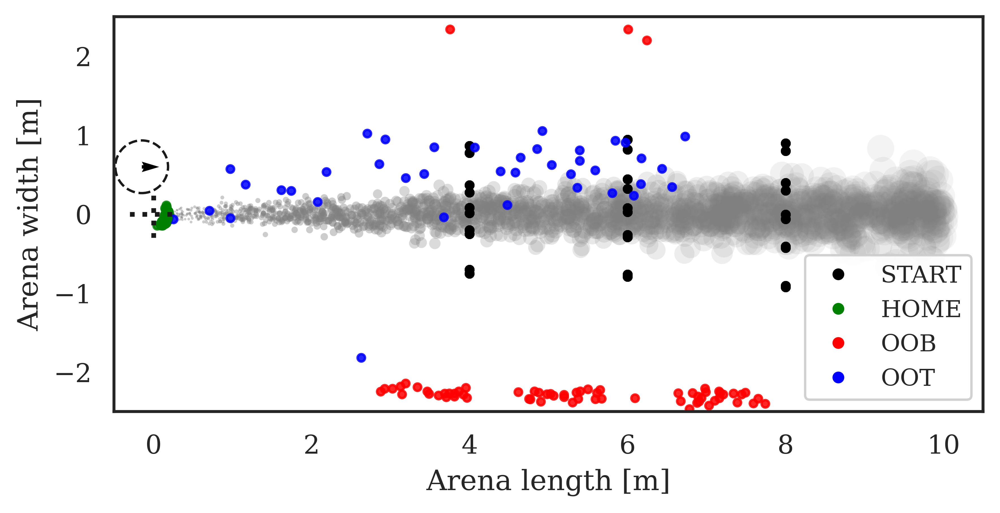

constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_776762_constantx5b5.png


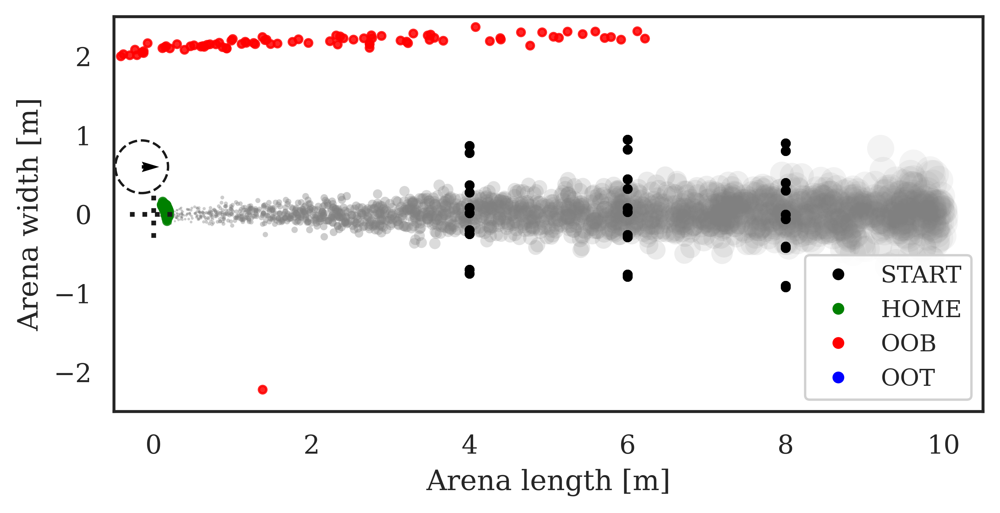

constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_2760377_constantx5b5.png


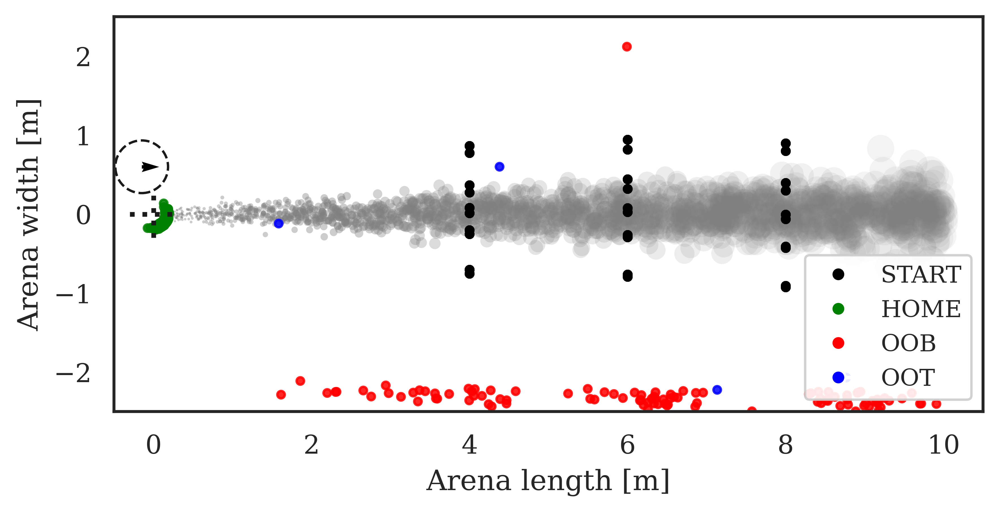

constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_3199993_constantx5b5.png


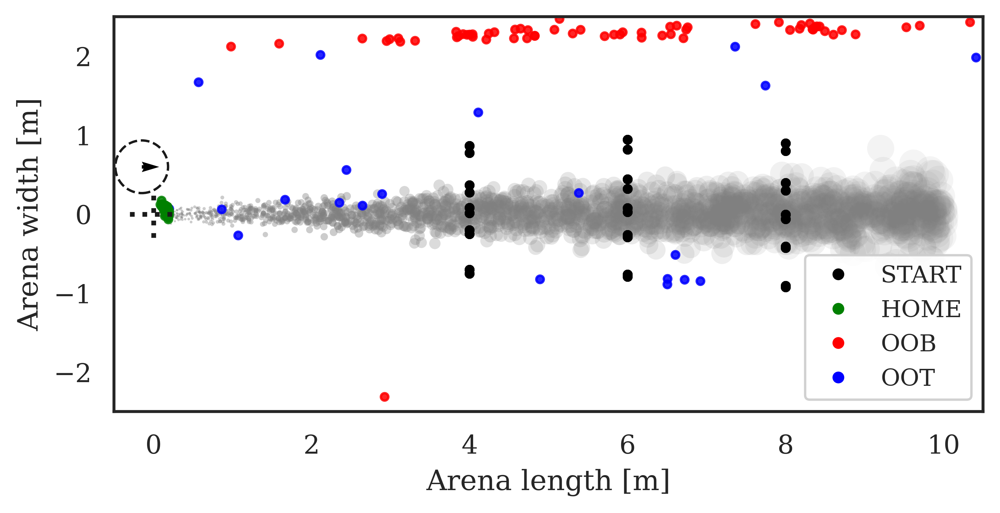

In [57]:
import sim_analysis as plume_analysis

for seed in all_episodes_df.query("model_code == 'MLPs888'")['seed'].unique():
    dataset = 'constantx5b5'
#     seed = all_episodes_df.query("model_code == 'MLPs888'")['seed'].unique()[0]

    ep_metadata_df = all_episodes_df.query("model_code == 'MLPs888' and seed == @seed and dataset == @dataset ")
    ep_metadata_df.shape

    data_puffs, data_wind = plume_analysis.load_plume(dataset, 
                                                      radius_multiplier=1.0)
    t_val = data_puffs['time'].iloc[-1]
    t_val = min(60, t_val -1)

    fname = ''
    plotsize=(6,4) # this needs to be bigger than what comes out!
#     plotsize=(5,3) # this needs to be bigger than what comes out!

    fig, ax = plume_analysis.plot_puffs_and_wind_vectors(data_puffs, data_wind, t_val, 
                                               fname=fname, plotsize=plotsize)

    # ax.set_xlim(-0.5, 10.5)
    # ax.set_xlim(-0.5, 6.5)
    # ax.set_ylim(-1.2, +1.2)

    plt.scatter(ep_metadata_df['start_x'], ep_metadata_df['start_y'], c='black', s=10)
    colors = {'HOME':'green', 'OOB':'red', 'OOT':'blue'}
    c = [colors[x] for x in ep_metadata_df['done']]
    plt.scatter(ep_metadata_df['end_x'], ep_metadata_df['end_y'], 
                c=c, alpha=0.85, s=10)

    # ax = plt.gca()
    # ax.set_aspect('equal')
    plt.xlim(-0.5, 10.5)
    plt.ylim(-2.5, 2.5)

    # Crosshair at source
    plt.plot([0, 0],[-0.3,+0.3],'k-', linestyle = ":", lw=2)
    plt.plot([-0.3,+0.3],[0, 0],'k-', linestyle = ":", lw=2)
    plt.xlabel('Arena length [m]')
    plt.ylabel('Arena width [m]')

    # Custom legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D

    legend_elements = [Line2D([0], [0], marker='o', color='w', label=i,
                  markerfacecolor=colors[i], markersize=6) for i in colors.keys()]
    legend_elements.insert(0, Line2D([0], [0], marker='o', color='w', label='START',
                  markerfacecolor='black', markersize=6) )     
    ax.legend(handles=legend_elements, loc='lower right', prop={'size': 10}, framealpha=0.9)                   

    plt.tight_layout()
    fname = f'{outdir}/start_stop_{seed}_{dataset}.png'
    plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')
    print(fname)
    plt.show()

constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_3307e9_constantx5b5.png


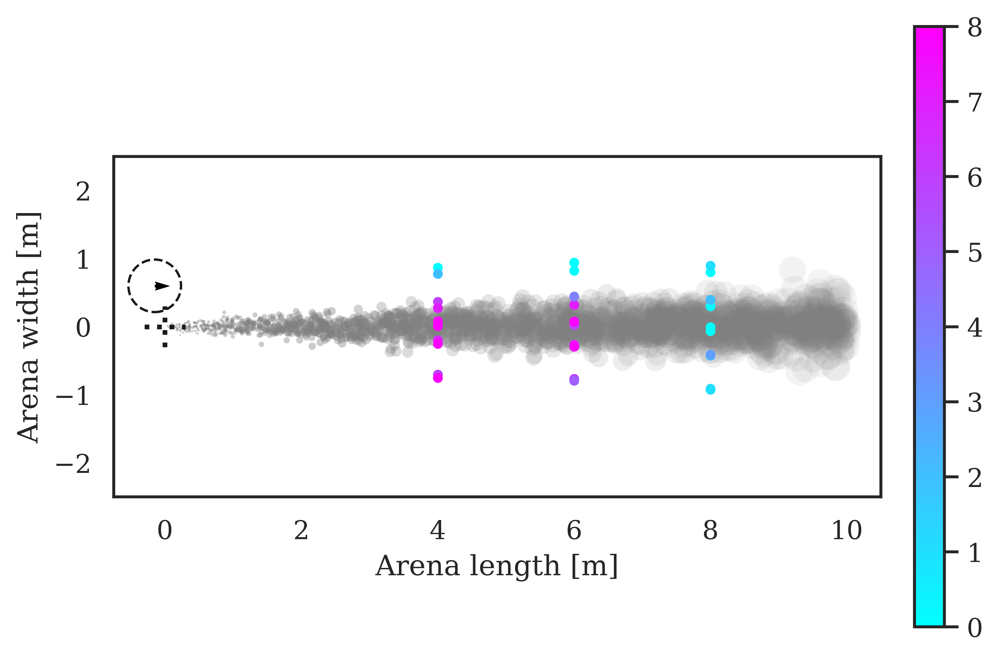

constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_9781ba_constantx5b5.png


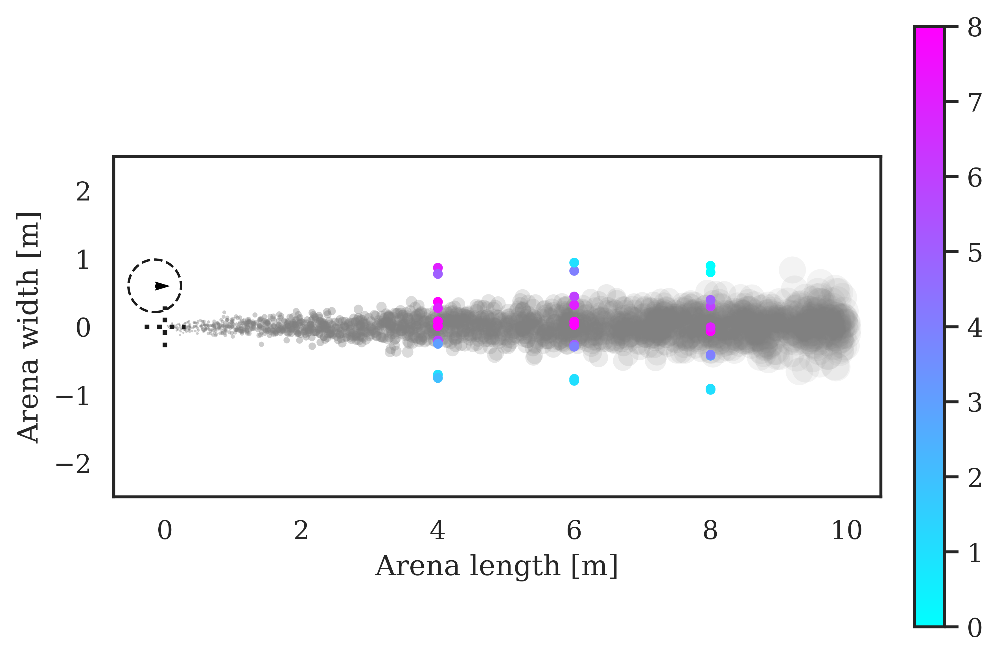

constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_776762_constantx5b5.png


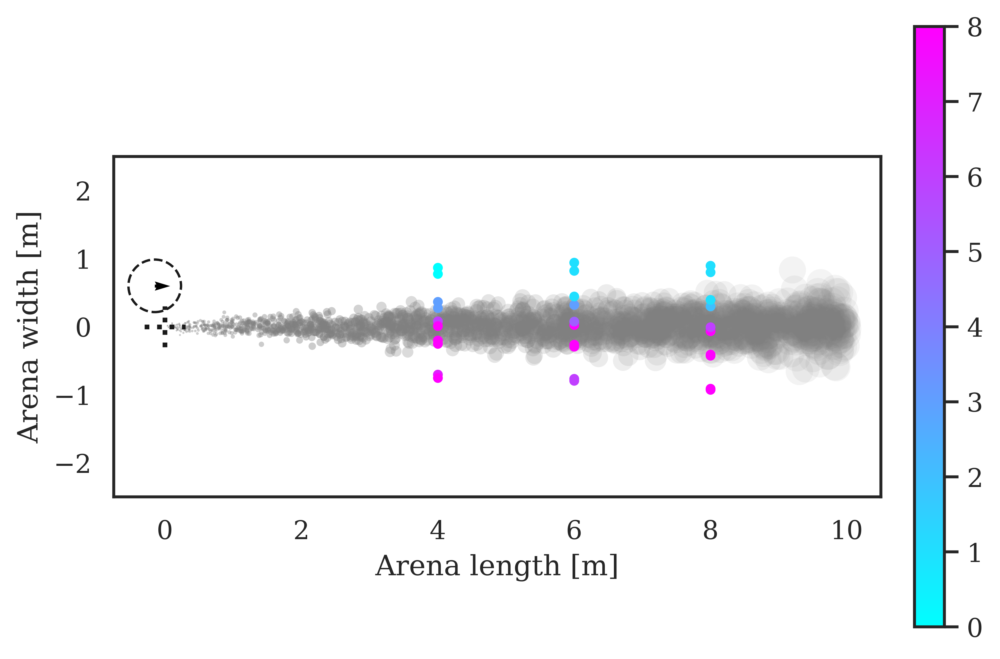

constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_2760377_constantx5b5.png


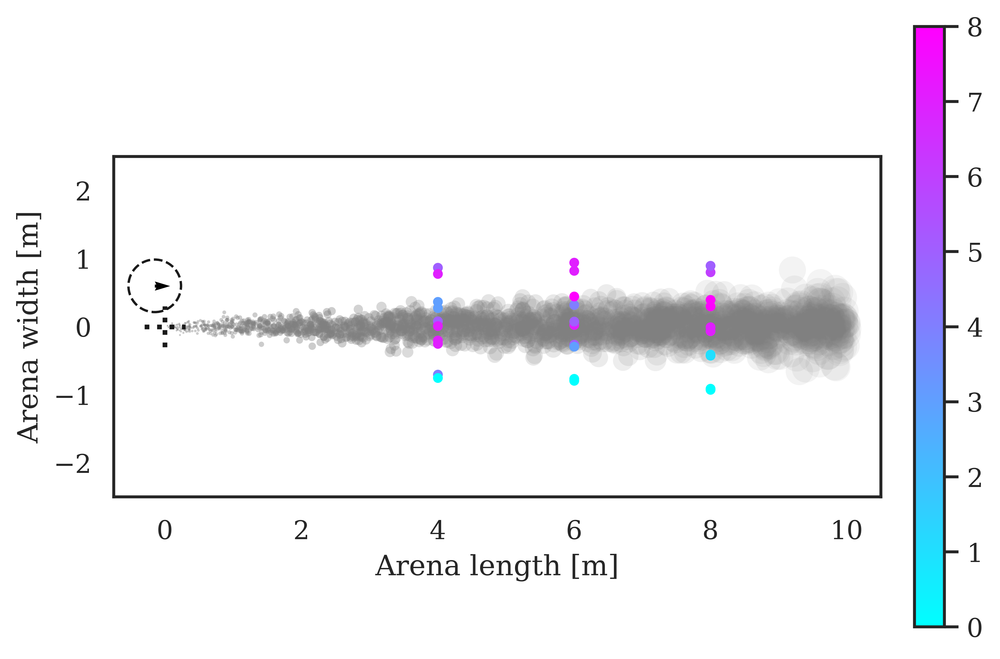

constantx5b5
/home/satsingh/plume/plumezoo/latest/fly/memory//report_diffs//start_stop_3199993_constantx5b5.png


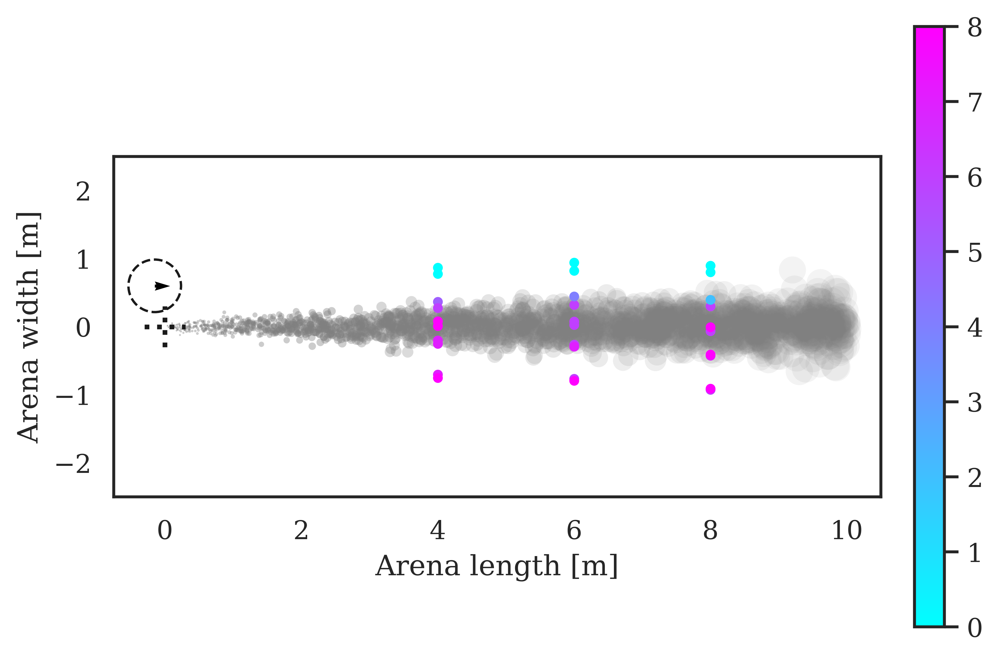

In [58]:
import sim_analysis as plume_analysis

for seed in all_episodes_df.query("model_code == 'MLPs888'")['seed'].unique():
    dataset = 'constantx5b5'
#     seed = all_episodes_df.query("model_code == 'MLPs888'")['seed'].unique()[0]

    ep_metadata_df = all_episodes_df.query("model_code == 'MLPs888' and seed == @seed and dataset == @dataset ")
    ep_metadata_df.shape

    data_puffs, data_wind = plume_analysis.load_plume(dataset, 
                                                      radius_multiplier=1.0)
    t_val = data_puffs['time'].iloc[-1]
    t_val = min(60, t_val -1)

    fname = ''
    plotsize=(6,4) # this needs to be bigger than what comes out!
#     plotsize=(5,3) # this needs to be bigger than what comes out!

    fig, ax = plume_analysis.plot_puffs_and_wind_vectors(data_puffs, data_wind, t_val, 
                                               fname=fname, plotsize=plotsize)

    ax.set_xlim(-0.5, 10.5)
    # ax.set_xlim(-0.5, 6.5)
    # ax.set_ylim(-1.2, +1.2)

    # Plot starting locations
#     plt.scatter(ep_metadata_df['start_x'], ep_metadata_df['start_y'], c='black', s=10)

    start_locs = ep_metadata_df.query('dataset == @dataset').loc[:,['start_x','start_y']].drop_duplicates()
    start_locs
    for idx, row in start_locs.iterrows():
        start_x = row['start_x']
        start_y = row['start_y']
        counts = ep_metadata_df.query('dataset == @dataset and start_x == @start_x and start_y == @start_y')['done'].value_counts().to_dict()
        counts['HOME'] = counts.get('HOME', 0)
        counts_max = sum(counts.values())
#         print(counts, counts['HOME'], sum(counts.values()) )
#         plt.scatter(start_x, start_y, c='black', s=10)
        im = plt.scatter(start_x, start_y, c=counts['HOME'], 
                    vmin=0, vmax=counts_max,
#                     edgecolor='k', 
                    cmap='cool', s=10)


    
    # Plot end locations
#     colors = {'HOME':'green', 'OOB':'red', 'OOT':'blue'}
#     c = [colors[x] for x in ep_metadata_df['done']]
#     plt.scatter(ep_metadata_df['end_x'], ep_metadata_df['end_y'], 
#                 c=c, alpha=0.85, s=10)

    # ax = plt.gca()
    # ax.set_aspect('equal')
    plt.xlim(-0.75, 10.5)
    plt.ylim(-2.5, 2.5)

    # Crosshair at source
    plt.plot([0, 0],[-0.3,+0.3],'k-', linestyle = ":", lw=2)
    plt.plot([-0.3,+0.3],[0, 0],'k-', linestyle = ":", lw=2)
    plt.xlabel('Arena length [m]')
    plt.ylabel('Arena width [m]')

#     plt.colorbar()
    plt.colorbar(im,fraction=0.046, pad=0.04)

    # Custom legend
#     from matplotlib.patches import Patch
#     from matplotlib.lines import Line2D

#     legend_elements = [Line2D([0], [0], marker='o', color='w', label=i,
#                   markerfacecolor=colors[i], markersize=6) for i in colors.keys()]
#     legend_elements.insert(0, Line2D([0], [0], marker='o', color='w', label='START',
#                   markerfacecolor='black', markersize=6) )     
#     ax.legend(handles=legend_elements, loc='lower right', prop={'size': 10}, framealpha=0.9)                   

    plt.tight_layout()
    fname = f'{outdir}/start_stop_{seed}_{dataset}.png'
    plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')
    print(fname)
    plt.show()

In [59]:
dataset = 'constantx5b5'
# all_by_start = ep_metadata_df.query('dataset == @dataset').loc[:,['done','start_x','start_y']].groupby(['start_x','start_y']).count().unstack(fill_value=0).stack() 
# home_by_start = ep_metadata_df.query('dataset == @dataset').loc[:,['done','index','start_x','start_y']].groupby(['done','start_x','start_y']).count().unstack(fill_value=0).stack() 
# all_by_start
# home_by_start

start_locs = ep_metadata_df.query('dataset == @dataset').loc[:,['start_x','start_y']].drop_duplicates()
start_locs

for idx, row in start_locs.iterrows():
    start_x = row['start_x']
    start_y = row['start_y']
    counts = ep_metadata_df.query('dataset == @dataset and start_x == @start_x and start_y == @start_y')['done'].value_counts().to_dict()
    counts['HOME'] = counts.get('HOME', 0)
    print(counts, counts['HOME'], sum(counts.values()) )



{'HOME': 7, 'OOB': 1} 7 8
{'HOME': 7, 'OOB': 1} 7 8
{'HOME': 8} 8 8
{'HOME': 5, 'OOB': 3} 5 8
{'OOB': 8, 'HOME': 0} 0 8
{'HOME': 8} 8 8
{'HOME': 7, 'OOT': 1} 7 8
{'HOME': 8} 8 8
{'HOME': 6, 'OOB': 2} 6 8
{'OOB': 8, 'HOME': 0} 0 8
{'HOME': 6, 'OOT': 2} 6 8
{'HOME': 6, 'OOT': 2} 6 8
{'HOME': 6, 'OOT': 2} 6 8
{'HOME': 6, 'OOB': 2} 6 8
{'OOB': 8, 'HOME': 0} 0 8
{'HOME': 8} 8 8
{'HOME': 7, 'OOT': 1} 7 8
{'HOME': 6, 'OOT': 2} 6 8
{'HOME': 4, 'OOB': 2, 'OOT': 2} 4 8
{'OOB': 8, 'HOME': 0} 0 8
{'HOME': 6, 'OOT': 2} 6 8
{'HOME': 7, 'OOT': 1} 7 8
{'HOME': 6, 'OOT': 2} 6 8
{'HOME': 6, 'OOT': 1, 'OOB': 1} 6 8
{'OOB': 8, 'HOME': 0} 0 8
{'HOME': 8} 8 8
{'HOME': 8} 8 8
{'HOME': 8} 8 8
{'OOB': 3, 'OOT': 3, 'HOME': 2} 2 8
{'OOB': 8, 'HOME': 0} 0 8


In [60]:
ep_metadata_df.columns

Index(['index', 'idx', 'done', 'ep_length', 'n_track', 'n_recover', 'n_search',
       'off_plume_fraction', 'turn_score', 'speed_score', 'num_exits',
       'max_exit_duration', 'max_stray_distance', 'max_odor_lastenc',
       'avg_stray_distance', 'avg_odor_lastenc', 'median_stray_distance',
       'median_odor_lastenc', 'agent_angle_ground_median', 'radius_final',
       'radius_covered', 'end_x', 'end_y', 'start_x', 'start_y', 'reward',
       'dataset', 'model_code', 'seed', 'p_track', 'p_recover', 'p_search'],
      dtype='object')